# Segmentez des clients d'un site e-commerce :
# Analyse exploratoire

Nous travaillons en tant que consultant pout l'entreprise Brésilienne **Olist** qui agrège des sites de commerce électronique en ligne pour faciliter les ventes directes sur les sites de commerce électronique du Brésil.  
Notre notre mission est d’aider les équipes d’Olist à comprendre les différents types d'utilisateurs. Nous utiliserons des méthodes non supervisées pour regrouper des clients de profils similaires. Ces catégories pourront être utilisées par l’équipe Marketing pour mieux communiquer.

Dans un premier temps nous allons procèder à une analyse exploratoire pour mieux comprendre les données mises à disposition. Cela comprendra une étude du comportement client ainsi qu'un feature engineering pour nous mettre dans de bonnes condition avant la mise en oeuvre des algorithmes non supervisés.

## Découverte des jeux de données. 
### Premières analyses et nettoyage

- Notre découvrons les jeux de données, pour mieux nous familliariser avec nous allons constuire au moins un graphiques par dataframe.
- Certaines caractéristique (colonnes) seront directement suprimées si leur pertinence est faible

In [164]:
from sklearn import preprocessing
from sklearn import decomposition

In [165]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
pd.set_option('display.max_columns', 50)

olist_customer = pd.read_csv('data/olist_customers_dataset.csv')
olist_geolocation = pd.read_csv('data/olist_geolocation_dataset.csv')
olist_orders = pd.read_csv('data/olist_orders_dataset.csv')
olist_order_items = pd.read_csv('data/olist_order_items_dataset.csv')
olist_order_payments = pd.read_csv('data/olist_order_payments_dataset.csv')
olist_order_reviews = pd.read_csv('data/olist_order_reviews_dataset.csv')
olist_products = pd.read_csv('data/olist_products_dataset.csv')
olist_sellers = pd.read_csv('data/olist_sellers_dataset.csv')
olist_translation = pd.read_csv('data/product_category_name_translation.csv')

**olist_customer**

In [166]:
print(olist_customer.shape)
olist_customer.head()

(99441, 5)


,customer_id,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state
0,06b8999e2fba1a1fbc88172c00ba8bc7,861eff4711a542e4b93843c6dd7febb0,14409,franca,SP
1,18955e83d337fd6b2def6b18a428ac77,290c77bc529b7ac935b93aa66c333dc3,9790,sao bernardo do campo,SP
2,4e7b3e00288586ebd08712fdd0374a03,060e732b5b29e8181a18229c7b0b2b5e,1151,sao paulo,SP
3,b2b6027bc5c5109e529d4dc6358b12c3,259dac757896d24d7702b9acbbff3f3c,8775,mogi das cruzes,SP
4,4f2d8ab171c80ec8364f7c12e35b23ad,345ecd01c38d18a9036ed96c73b8d066,13056,campinas,SP


In [167]:
olist_customer.drop_duplicates(subset = ['customer_id','customer_unique_id']).shape

(99441, 5)

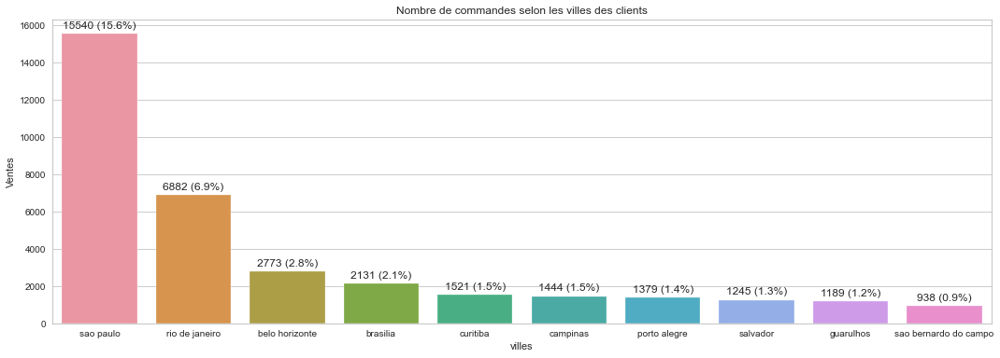

Le top 10 des villes représentent 35.23898593135628% de tous les clients


In [168]:
top_10 = olist_customer['customer_city'].value_counts()[:10]
plt.figure(figsize=(18,6))
ax = sns.barplot(x=top_10.index, y=top_10.values)

sum_poucent = 0
for p in ax.patches:
    pourcent = format(100*p.get_height()/len(olist_customer),'.1f')
    a = 100*p.get_height()/len(olist_customer)
    text = str(int(p.get_height())) + ' ('+str(pourcent)+'%)'
    ax.annotate(text, 
                (p.get_x() + p.get_width() / 2., p.get_height()), 
                ha = 'center', va = 'center', 
                xytext = (0, 9), 
                textcoords = 'offset points')
    sum_poucent = sum_poucent + a

plt.title('Nombre de commandes selon les villes des clients')
plt.xlabel('villes')
plt.ylabel('Ventes')
plt.show()
print(f'Le top 10 des villes représentent {sum_poucent}% de tous les clients')

**olist_geolocation**

In [169]:
print(olist_geolocation.shape)
olist_geolocation.head()

(1000163, 5)


,geolocation_zip_code_prefix,geolocation_lat,geolocation_lng,geolocation_city,geolocation_state
0,1037,-23.545621,-46.639292,sao paulo,SP
1,1046,-23.546081,-46.644820,sao paulo,SP
2,1046,-23.546129,-46.642951,sao paulo,SP
3,1041,-23.544392,-46.639499,sao paulo,SP
4,1035,-23.541578,-46.641607,sao paulo,SP


In [170]:
# on supprime les doublons sur le zip code (on garde la dernière ligne, sans douté l'adresse actuelle)
olist_geolocation = olist_geolocation.drop_duplicates(subset = ['geolocation_zip_code_prefix'],keep = 'last')
olist_geolocation.shape

(19015, 5)

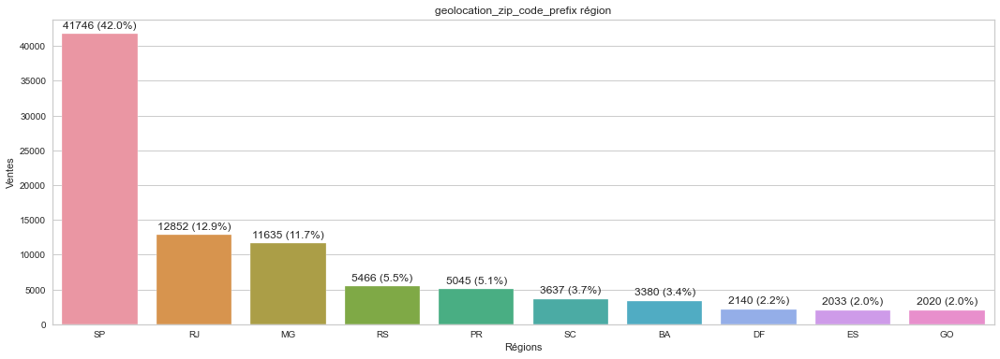

Le top 10 des pays représentent 90.45966955280015% de toutes les geolocation_zip_code_prefix


In [171]:
top_10 = olist_customer['customer_state'].value_counts()[:10]
plt.figure(figsize=(18,6))
ax = sns.barplot(x=top_10.index, y=top_10.values)

sum_poucent = 0
for p in ax.patches:
    pourcent = format(100*p.get_height()/len(olist_customer),'.1f')
    a = 100*p.get_height()/len(olist_customer)
    text = str(int(p.get_height())) + ' ('+str(pourcent)+'%)'
    ax.annotate(text, 
                (p.get_x() + p.get_width() / 2., p.get_height()), 
                ha = 'center', va = 'center', 
                xytext = (0, 9), 
                textcoords = 'offset points')
    sum_poucent = sum_poucent + a

plt.title('geolocation_zip_code_prefix région')
plt.xlabel('Régions')
plt.ylabel('Ventes')
plt.show()
print(f'Le top 10 des pays représentent {sum_poucent}% de toutes les geolocation_zip_code_prefix')

**olist_orders**

In [172]:
print(olist_orders.shape)
olist_orders.head()

(99441, 8)


,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date
0,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18 00:00:00
1,53cdb2fc8bc7dce0b6741e2150273451,b0830fb4747a6c6d20dea0b8c802d7ef,delivered,2018-07-24 20:41:37,2018-07-26 03:24:27,2018-07-26 14:31:00,2018-08-07 15:27:45,2018-08-13 00:00:00
2,47770eb9100c2d0c44946d9cf07ec65d,41ce2a54c0b03bf3443c3d931a367089,delivered,2018-08-08 08:38:49,2018-08-08 08:55:23,2018-08-08 13:50:00,2018-08-17 18:06:29,2018-09-04 00:00:00
3,949d5b44dbf5de918fe9c16f97b45f8a,f88197465ea7920adcdbec7375364d82,delivered,2017-11-18 19:28:06,2017-11-18 19:45:59,2017-11-22 13:39:59,2017-12-02 00:28:42,2017-12-15 00:00:00
4,ad21c59c0840e6cb83a9ceb5573f8159,8ab97904e6daea8866dbdbc4fb7aad2c,delivered,2018-02-13 21:18:39,2018-02-13 22:20:29,2018-02-14 19:46:34,2018-02-16 18:17:02,2018-02-26 00:00:00


In [173]:
olist_orders.drop_duplicates().shape

(99441, 8)

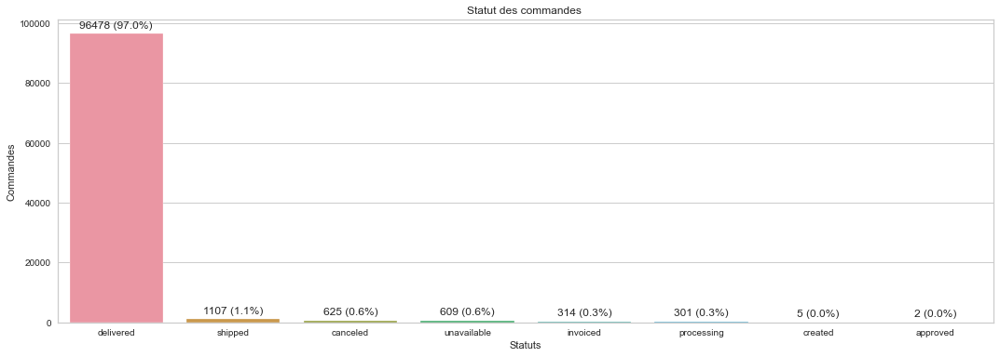

In [174]:
top_10 = olist_orders['order_status'].value_counts()[:10]
plt.figure(figsize=(18,6))
ax = sns.barplot(x=top_10.index, y=top_10.values)

sum_poucent = 0
for p in ax.patches:
    pourcent = format(100*p.get_height()/len(olist_orders),'.1f')
    a = 100*p.get_height()/len(olist_customer)
    text = str(int(p.get_height())) + ' ('+str(pourcent)+'%)'
    ax.annotate(text, 
                (p.get_x() + p.get_width() / 2., p.get_height()), 
                ha = 'center', va = 'center', 
                xytext = (0, 9), 
                textcoords = 'offset points')
    sum_poucent = sum_poucent + a

plt.title('Statut des commandes ')
plt.xlabel('Statuts')
plt.ylabel('Commandes')
plt.show()

- Nous constatons que plusieurs dates sont disponibles : etimation de livraison, validation de la commande. Nous gardons uniqument la date **'order_purchase_timestamp'** qui représente la validation du panier par le client

In [175]:
olist_orders = olist_orders.drop(columns=['order_approved_at', 'order_delivered_carrier_date',
                                         'order_delivered_customer_date','order_estimated_delivery_date'])

**olist_order_items**

In [176]:
print(olist_order_items.shape)
olist_order_items.head()

(112650, 7)


,order_id,order_item_id,product_id,seller_id,shipping_limit_date,price,freight_value
0,00010242fe8c5a6d1ba2dd792cb16214,1,4244733e06e7ecb4970a6e2683c13e61,48436dade18ac8b2bce089ec2a041202,2017-09-19 09:45:35,58.90,13.29
1,00018f77f2f0320c557190d7a144bdd3,1,e5f2d52b802189ee658865ca93d83a8f,dd7ddc04e1b6c2c614352b383efe2d36,2017-05-03 11:05:13,239.90,19.93
2,000229ec398224ef6ca0657da4fc703e,1,c777355d18b72b67abbeef9df44fd0fd,5b51032eddd242adc84c38acab88f23d,2018-01-18 14:48:30,199.00,17.87
3,00024acbcdf0a6daa1e931b038114c75,1,7634da152a4610f1595efa32f14722fc,9d7a1d34a5052409006425275ba1c2b4,2018-08-15 10:10:18,12.99,12.79
4,00042b26cf59d7ce69dfabb4e55b4fd9,1,ac6c3623068f30de03045865e4e10089,df560393f3a51e74553ab94004ba5c87,2017-02-13 13:57:51,199.90,18.14


In [177]:
olist_order_items.drop_duplicates().shape

(112650, 7)

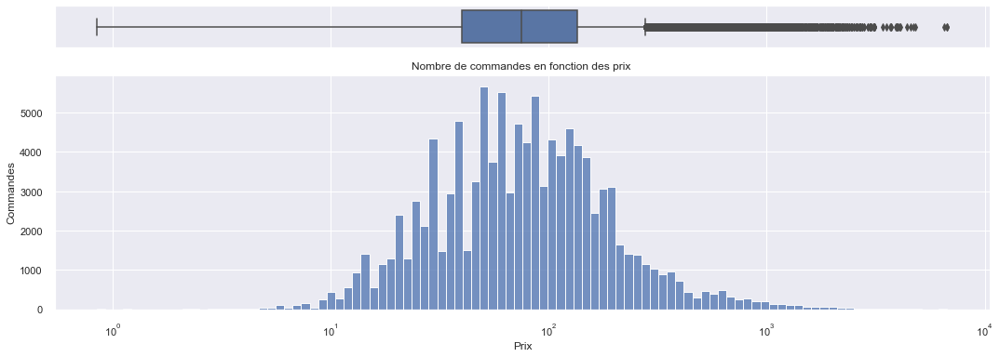

In [178]:
import seaborn as sns
import matplotlib.pyplot as plt
sns.set(style="darkgrid")

 
# creating a figure composed of two matplotlib.Axes objects (ax_box and ax_hist)
f, (ax_box, ax_hist) = plt.subplots(2, sharex=True, gridspec_kw={"height_ratios": (.15, .85)},figsize=(18,6))
 
# assigning a graph to each ax
sns.boxplot(olist_order_items["price"], ax=ax_box)
sns.histplot(data=olist_order_items, x="price", ax=ax_hist,log_scale=True, bins = 100)
 
# Remove x axis name for the boxplot
ax_box.set(xlabel='')
ax_hist.set(ylabel='Commandes')
ax_hist.set(xlabel='Prix')


plt.title('Nombre de commandes en fonction des prix ')
plt.show()

- Nous supprimons 'shipping_limit_date' qui représente la date limite de commande d'un produit. 

In [179]:
olist_order_items = olist_order_items.drop(columns=['shipping_limit_date'])

**olist_order_payments**

In [180]:
print(olist_order_payments.shape)
olist_order_payments.head()

(103886, 5)


,order_id,payment_sequential,payment_type,payment_installments,payment_value
0,b81ef226f3fe1789b1e8b2acac839d17,1,credit_card,8,99.33
1,a9810da82917af2d9aefd1278f1dcfa0,1,credit_card,1,24.39
2,25e8ea4e93396b6fa0d3dd708e76c1bd,1,credit_card,1,65.71
3,ba78997921bbcdc1373bb41e913ab953,1,credit_card,8,107.78
4,42fdf880ba16b47b59251dd489d4441a,1,credit_card,2,128.45


In [181]:
olist_order_payments[olist_order_payments['order_id'] == '5cfd514482e22bc992e7693f0e3e8df7']

,order_id,payment_sequential,payment_type,payment_installments,payment_value
25,5cfd514482e22bc992e7693f0e3e8df7,2,voucher,1,45.17
57742,5cfd514482e22bc992e7693f0e3e8df7,1,credit_card,4,665.41


In [182]:
olist_order_payments.sort_values(by = 'payment_value', axis=0, ascending=False)

,order_id,payment_sequential,payment_type,payment_installments,payment_value
52107,03caa2c082116e1d31e67e9ae3700499,1,credit_card,1,13664.08
34370,736e1922ae60d0d6a89247b851902527,1,boleto,1,7274.88
41419,0812eb902a67711a1cb742b3cdaa65ae,1,credit_card,8,6929.31
49581,fefacc66af859508bf1a7934eab1e97f,1,boleto,1,6922.21
85539,f5136e38d1a14a4dbd87dff67da82701,1,boleto,1,6726.66
...,...,...,...,...,...
43744,6ccb433e00daae1283ccc956189c82ae,4,voucher,1,0.00
62674,45ed6e85398a87c253db47c2d9f48216,3,voucher,1,0.00
19922,8bcbe01d44d147f901cd3192671144db,4,voucher,1,0.00
94427,c8c528189310eaa44a745b8d9d26908b,1,not_defined,1,0.00


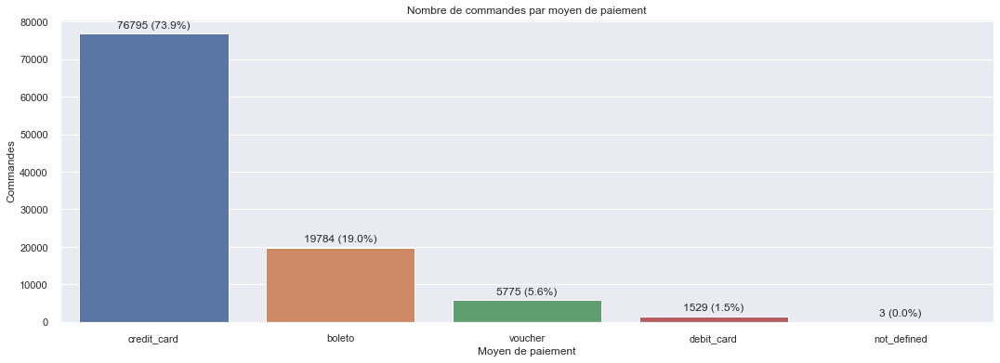

In [183]:
top_10 = olist_order_payments['payment_type'].value_counts()
plt.figure(figsize=(18,6))
ax = sns.barplot(x=top_10.index, y=top_10.values)

sum_poucent = 0
for p in ax.patches:
    pourcent = format(100*p.get_height()/len(olist_order_payments),'.1f')
    a = 100*p.get_height()/len(olist_customer)
    text = str(int(p.get_height())) + ' ('+str(pourcent)+'%)'
    ax.annotate(text, 
                (p.get_x() + p.get_width() / 2., p.get_height()), 
                ha = 'center', va = 'center', 
                xytext = (0, 9), 
                textcoords = 'offset points')
    sum_poucent = sum_poucent + a

plt.title('Nombre de commandes par moyen de paiement')
plt.xlabel('Moyen de paiement')
plt.ylabel('Commandes')
plt.show()

In [184]:
# certaines commandes comportent plusieurs moyen de payment. comme par exemple payment par carte + bon de réduction 
# nous faisons le choix de gerder uniquement le moyen de payment avec le plus gros montant.
olist_order_payments = olist_order_payments.sort_values(by = 'payment_value', axis=0, ascending=False)

olist_order_payments = olist_order_payments.drop_duplicates(subset = ['order_id'],keep = 'first')

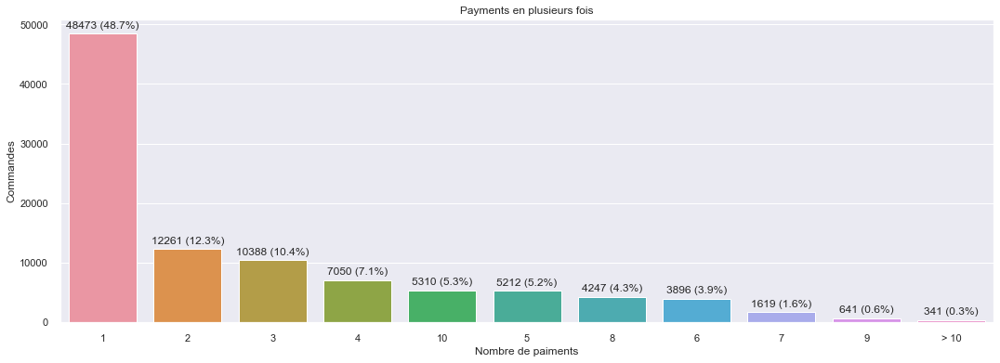

In [185]:
top_10 = olist_order_payments['payment_installments'].value_counts()
data_frame = pd.DataFrame(top_10).reset_index()
mask_10 = data_frame['index'] > 10
data_frame[mask_10]['payment_installments'].sum() # = 341
data_frame.append(['>10', '341'])
new_row = {'index':'> 10', 'payment_installments':341}
#append row to the dataframe
data_frame = data_frame.drop(data_frame.index[10:])
data_frame = data_frame.append(new_row, ignore_index=True)


plt.figure(figsize=(18,6))
ax = sns.barplot(x=data_frame['index'], y=data_frame['payment_installments'])

sum_poucent = 0
for p in ax.patches:
    pourcent = format(100*p.get_height()/len(olist_order_payments),'.1f')
    a = 100*p.get_height()/len(olist_customer)
    text = str(int(p.get_height())) + ' ('+str(pourcent)+'%)'
    ax.annotate(text, 
                (p.get_x() + p.get_width() / 2., p.get_height()), 
                ha = 'center', va = 'center', 
                xytext = (0, 9), 
                textcoords = 'offset points')
    sum_poucent = sum_poucent + a

plt.title('Payments en plusieurs fois')
plt.xlabel('Nombre de paiments')
plt.ylabel('Commandes')
plt.show()

**olist_order_reviews**

In [186]:
print(olist_order_reviews.shape)
olist_order_reviews.head()

(99224, 7)


,review_id,order_id,review_score,review_comment_title,review_comment_message,review_creation_date,review_answer_timestamp
0,7bc2406110b926393aa56f80a40eba40,73fc7af87114b39712e6da79b0a377eb,4,NaN,NaN,2018-01-18 00:00:00,2018-01-18 21:46:59
1,80e641a11e56f04c1ad469d5645fdfde,a548910a1c6147796b98fdf73dbeba33,5,NaN,NaN,2018-03-10 00:00:00,2018-03-11 03:05:13
2,228ce5500dc1d8e020d8d1322874b6f0,f9e4b658b201a9f2ecdecbb34bed034b,5,NaN,NaN,2018-02-17 00:00:00,2018-02-18 14:36:24
3,e64fb393e7b32834bb789ff8bb30750e,658677c97b385a9be170737859d3511b,5,NaN,Recebi bem antes do prazo estipulado.,2017-04-21 00:00:00,2017-04-21 22:02:06
4,f7c4243c7fe1938f181bec41a392bdeb,8e6bfb81e283fa7e4f11123a3fb894f1,5,NaN,Parabéns lojas lannister adorei comprar pela I...,2018-03-01 00:00:00,2018-03-02 10:26:53


In [187]:
olist_order_reviews.drop_duplicates().shape

(99224, 7)

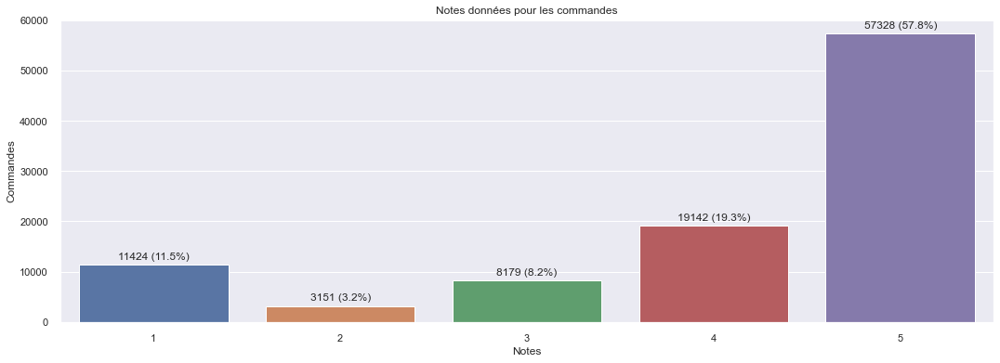

In [188]:
top_10 = olist_order_reviews['review_score'].value_counts()
plt.figure(figsize=(18,6))
ax = sns.barplot(x=top_10.index, y=top_10.values)

sum_poucent = 0
for p in ax.patches:
    pourcent = format(100*p.get_height()/len(olist_order_reviews),'.1f')
    a = 100*p.get_height()/len(olist_order_reviews)
    text = str(int(p.get_height())) + ' ('+str(pourcent)+'%)'
    ax.annotate(text, 
                (p.get_x() + p.get_width() / 2., p.get_height()), 
                ha = 'center', va = 'center', 
                xytext = (0, 9), 
                textcoords = 'offset points')
    sum_poucent = sum_poucent + a

plt.title('Notes données pour les commandes')
plt.xlabel('Notes')
plt.ylabel('Commandes')
plt.show()

- Nous considérons que le titre, le message et la date de la review ne sont pas vraiment pertinents.

In [189]:
olist_order_reviews = olist_order_reviews.drop(columns=['review_comment_title'
                                                        ,'review_comment_message'
                                                        ,'review_creation_date'
                                                        ,'review_answer_timestamp'
                                                       ])

**olist_products**

In [190]:
print(olist_products.shape)
olist_products.head()

(32951, 9)


,product_id,product_category_name,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm
0,1e9e8ef04dbcff4541ed26657ea517e5,perfumaria,40.0,287.0,1.0,225.0,16.0,10.0,14.0
1,3aa071139cb16b67ca9e5dea641aaa2f,artes,44.0,276.0,1.0,1000.0,30.0,18.0,20.0
2,96bd76ec8810374ed1b65e291975717f,esporte_lazer,46.0,250.0,1.0,154.0,18.0,9.0,15.0
3,cef67bcfe19066a932b7673e239eb23d,bebes,27.0,261.0,1.0,371.0,26.0,4.0,26.0
4,9dc1a7de274444849c219cff195d0b71,utilidades_domesticas,37.0,402.0,4.0,625.0,20.0,17.0,13.0


In [191]:
olist_products.drop_duplicates(subset = ['product_id']).shape

(32951, 9)

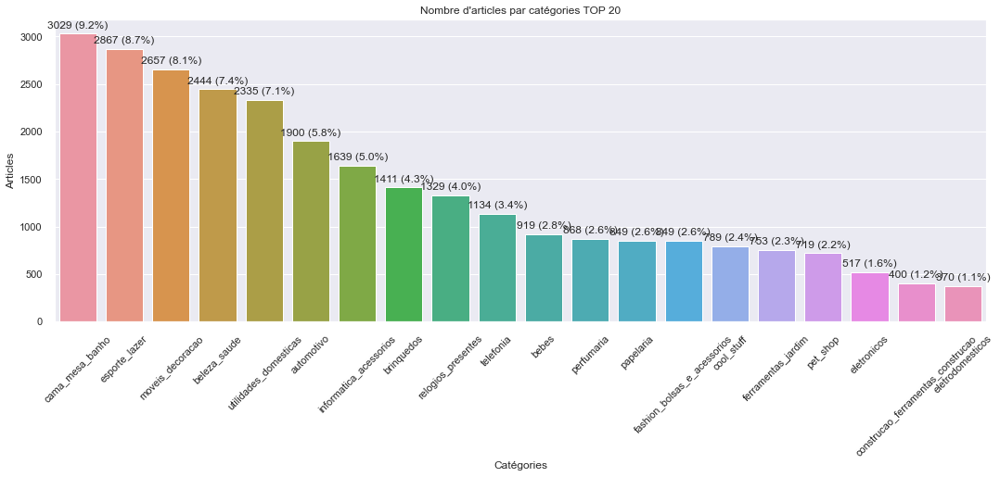

Le top 20 des catégories représentent 84.30093168644352% de tous les articles


In [192]:
top_10 = olist_products['product_category_name'].value_counts()[:20]
plt.figure(figsize=(18,6))
ax = sns.barplot(x=top_10.index, y=top_10.values)

sum_poucent = 0
for p in ax.patches:
    pourcent = format(100*p.get_height()/len(olist_products),'.1f')
    a = 100*p.get_height()/len(olist_products)
    text = str(int(p.get_height())) + ' ('+str(pourcent)+'%)'
    ax.annotate(text, 
                (p.get_x() + p.get_width() / 2., p.get_height()), 
                ha = 'center', va = 'center', 
                xytext = (0, 9), 
                textcoords = 'offset points')
    sum_poucent = sum_poucent + a

plt.title("Nombre d'articles par catégories TOP 20")
plt.xlabel('Catégories')
plt.ylabel('Articles')
plt.xticks(rotation=45)
plt.show()
print(f'Le top 20 des catégories représentent {sum_poucent}% de tous les articles')

In [193]:
nb_cat = len(olist_products['product_category_name'].unique())
print(f"Il y a {nb_cat} catégories")

Il y a 74 catégories


- La longueur de la description du produit et du nom ne sont pas pertinentes

In [194]:
olist_products = olist_products.drop(columns=['product_description_lenght'
                                              ,'product_name_lenght'
                                              ,'product_photos_qty'
                                           ])


**olist_sellers**

In [195]:
print(olist_sellers.shape)
olist_sellers.head()

(3095, 4)


,seller_id,seller_zip_code_prefix,seller_city,seller_state
0,3442f8959a84dea7ee197c632cb2df15,13023,campinas,SP
1,d1b65fc7debc3361ea86b5f14c68d2e2,13844,mogi guacu,SP
2,ce3ad9de960102d0677a81f5d0bb7b2d,20031,rio de janeiro,RJ
3,c0f3eea2e14555b6faeea3dd58c1b1c3,4195,sao paulo,SP
4,51a04a8a6bdcb23deccc82b0b80742cf,12914,braganca paulista,SP


In [196]:
olist_sellers.drop_duplicates(subset = ['seller_id']).shape

(3095, 4)

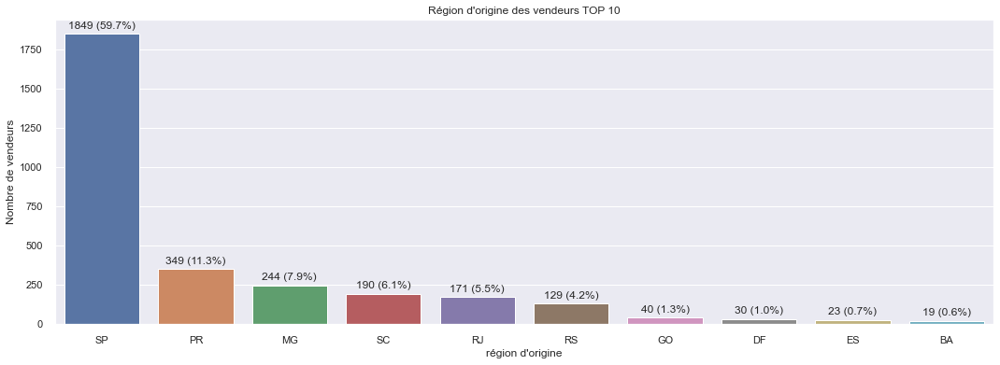

Le top 10 des régions représentent 98.35218093699515% de tous les articles


In [197]:
top_10 = olist_sellers['seller_state'].value_counts()[:10]
plt.figure(figsize=(18,6))
ax = sns.barplot(x=top_10.index, y=top_10.values)

sum_poucent = 0
for p in ax.patches:
    pourcent = format(100*p.get_height()/len(olist_sellers),'.1f')
    a = 100*p.get_height()/len(olist_sellers)
    text = str(int(p.get_height())) + ' ('+str(pourcent)+'%)'
    ax.annotate(text, 
                (p.get_x() + p.get_width() / 2., p.get_height()), 
                ha = 'center', va = 'center', 
                xytext = (0, 9), 
                textcoords = 'offset points')
    sum_poucent = sum_poucent + a

plt.title("Région d'origine des vendeurs TOP 10")
plt.xlabel("région d'origine")
plt.ylabel('Nombre de vendeurs')
plt.show()
print(f'Le top 10 des régions représentent {sum_poucent}% de tous les articles')

**olist_translation**

In [198]:
print(olist_translation.shape)
olist_translation.head()

(71, 2)


,product_category_name,product_category_name_english
0,beleza_saude,health_beauty
1,informatica_acessorios,computers_accessories
2,automotivo,auto
3,cama_mesa_banho,bed_bath_table
4,moveis_decoracao,furniture_decor


In [199]:
olist_translation.drop_duplicates(subset = ['product_category_name']).shape

(71, 2)

### Premières observations et suggestions de tansfomation : 

- olist_customer :
    - dimension  (99441, 5)
    - identifiants des clients/adresse 

- olist_geolocation :
    - (1000163, 5)
    - adresse détaillée à partir du code dans olist_customer 

- olist_orders :
    - (99441, 8)
    - Liste des commandes reliées à un client. Infos sur les dates de commande/livraison
    - Garder uniquement delivered et shipped (on dit qu'on ne s'interesse qu'au ventes qui on vraiment eu lieu)

- olist_order_items:
    - (112650, 7)
    - liste des produits reliée à une commande et à un vendeur. Prix du produit frais de port

- olist_order_payments:
    - (103886, 5) 
    - méthodes de payement reliées à une commande.
    - supprimer les 3 not_defined
    - pour les paiements en plusieurs fois faire des groupes : 1, [2,5], [5 et plus]

- olist_order_reviews:
    - (99224, 7)
    - note de satifaction client reliée à une commande

- olist_products:
    - (32951, 9)
    - détails des produits (catégories, dimensions)
    - regrouper éventuellemnt les petites catégories dans des plus grandes (20 catégories représentent 85% de produits), nous allons le faire à l'étape suivante, car à postériorie il y a vaiment un trop grand nombre de catégories. En plus certaines sont vraiment trés similaires.
    - calculer plutot le volume pour ne pas garder hauteur, longueur, largeur

- olist_sellers:
    - (3095, 4)
    - Information sur les vendeurs en fonction de leur indentifiant

- olist_translation:
    - (71, 2)
    - traduction de la catégorie des produits en anglais


In [200]:
# modification de olist_orders
mask1 = olist_orders['order_status'] == 'delivered'
mask2 = olist_orders['order_status'] == 'shipped'
olist_orders = olist_orders[mask1+mask2]

In [201]:
# modification de olist_orders product_length_cm product_height_cm product_width_cm
olist_products['volume_cm_3'] = olist_products['product_length_cm'] *  \
                                olist_products['product_height_cm'] * \
                                olist_products['product_width_cm']
olist_products = olist_products.drop(columns=['product_length_cm','product_height_cm','product_width_cm'])

**olist_translation : nous voulons créer des familles d'article plus grande. Nous travaillons avec les définitions en anglais pour plus de simplicité**

Nous devons tout faire "A la main"

In [202]:
olist_translation['product_category_name_english'].unique()

array(['health_beauty', 'computers_accessories', 'auto', 'bed_bath_table',
       'furniture_decor', 'sports_leisure', 'perfumery', 'housewares',
       'telephony', 'watches_gifts', 'food_drink', 'baby', 'stationery',
       'tablets_printing_image', 'toys', 'fixed_telephony',
       'garden_tools', 'fashion_bags_accessories', 'small_appliances',
       'consoles_games', 'audio', 'fashion_shoes', 'cool_stuff',
       'luggage_accessories', 'air_conditioning',
       'construction_tools_construction',
       'kitchen_dining_laundry_garden_furniture',
       'costruction_tools_garden', 'fashion_male_clothing', 'pet_shop',
       'office_furniture', 'market_place', 'electronics',
       'home_appliances', 'party_supplies', 'home_confort',
       'costruction_tools_tools', 'agro_industry_and_commerce',
       'furniture_mattress_and_upholstery', 'books_technical',
       'home_construction', 'musical_instruments',
       'furniture_living_room', 'construction_tools_lights',
       'indust

In [203]:
dict_categories = {
# géneral maison
'furniture_living_room' : 'géneral maison',
'furniture_mattress_and_upholstery' : 'géneral maison',
'furniture_bedroom' : 'géneral maison',
'furniture_decor' : 'géneral maison',
'bed_bath_table' : 'géneral maison',
'kitchen_dining_laundry_garden_furniture' : 'géneral maison',
'la_cuisine' : 'géneral maison',
'home_confort' : 'géneral maison',
'home_comfort_2' : 'géneral maison',
'christmas_supplies' : 'géneral maison',
'housewares' : 'géneral maison',
'furnitures' : 'géneral maison',
    
# electro ménager
'small_appliances' : 'electro ménager',
'small_appliances_home_oven_and_coffee' : 'electro ménager',
'home_appliances_2' : 'electro ménager',
'home_appliances' : 'electro ménager',
'air_conditioning': 'electro ménager',
    
#construction
'construction_tools_construction': 'construction',
'costruction_tools_garden': 'construction',
'costruction_tools_tools': 'construction',
'construction_tools_safety': 'construction',
'construction_tools_lights': 'construction',
'home_construction': 'construction',

    
#business
'office_furniture' : 'business',
'industry_commerce_and_business' : 'business',
'stationery' : 'business',
'agro_industry_and_commerce' : 'business',
'signaling_and_security' : 'business',
'security_and_services' : 'business',

#electronique
'telephony' : 'electronique',
'electronics': 'electronique',
'computers_accessories': 'electronique',
'consoles_games': 'electronique',
'fixed_telephony': 'electronique',
'audio': 'electronique',
'computers': 'electronique',
'tablets_printing_image': 'electronique',
    
#sports et divertissement
'sports_leisure' : 'divertissement',
'party_supplies': 'divertissement',
'toys': 'divertissement',

# livres    
'books' : 'livres',
'books_imported': 'livres',
'books_general_interest': 'livres',
'books_technical': 'livres',

#arts
'art': 'arts',
'cine_photo': 'arts',
'cds_dvds_musicals': 'arts',
'music': 'arts',
'dvds_blu_ray': 'arts',
'arts_and_craftmanship': 'arts',
'musical_instruments': 'arts',

    
#vetement
'watches_gifts' : 'vetement',
'fashion_bags_accessories' : 'vetement',
'fashion_underwear_beach' : 'vetement',
'fashion_shoes' : 'vetement', 
'fashion_male_clothing' : 'vetement',
'fashio_female_clothing' : 'vetement',
'fashion_sport' : 'vetement',
'fashion_childrens_clothes' : 'vetement',
'luggage_accessories': 'vetement',

#Soin
'health_beauty' : 'Soin', 
'baby': 'Soin',
'diapers_and_hygiene' : 'Soin',
'perfumery' : 'Soin',

#animaux et jardin
'flowers' : 'animaux jardin',
'pet_shop' : 'animaux jardin',
'garden_tools' : 'animaux jardin',
    
#auto
'auto' : 'auto',
    
#nouriture
'food_drink' : 'nouriture',
'food' : 'nouriture',
'drinks' : 'nouriture',
    
#other
'Unknown' : 'other',
'market_place' : 'other', 
'cool_stuff' : 'other'}

Nous avons donc plusieurs données à disposition et nous voulons les regrouper. Une première étape consiste à nettoyer les jeux de données.

## Agrégation des data sets et nettoyage

- on ajoute les localisations aux clients et aux vendeurs
- à partir de la liste des commandes unique on ajoute des infos comme l'id locale du client le statu et les dates
- Note : le nombre de lignes des commandes item ne change pas
    - On a bien vérifié avant qu'il n'y avait pas doublons

In [204]:
olist_geolocation_drop = olist_geolocation.drop(['geolocation_city', 'geolocation_state'], axis=1)
loc_geo = olist_geolocation_drop.rename(columns={"geolocation_zip_code_prefix": "customer_zip_code_prefix"})
loc_geo = loc_geo.drop_duplicates(subset=['customer_zip_code_prefix'], keep='last')
olist_customer_geo = pd.merge(olist_customer, loc_geo, on="customer_zip_code_prefix")
olist_customer_geo = olist_customer_geo.rename(columns={"geolocation_lat": "customer_lat"})
olist_customer_geo = olist_customer_geo.rename(columns={"geolocation_lng": "customer_lng"})

In [205]:
olist_geolocation_drop = olist_geolocation.drop(['geolocation_city', 'geolocation_state'], axis=1)
loc_geo = olist_geolocation_drop.rename(columns={"geolocation_zip_code_prefix": "seller_zip_code_prefix"})
loc_geo = loc_geo.drop_duplicates(subset=['seller_zip_code_prefix'], keep='last')
olist_seller_geo = pd.merge(olist_sellers, loc_geo, on="seller_zip_code_prefix")
olist_seller_geo = olist_seller_geo.rename(columns={"geolocation_lat": "seller_lat"})
olist_seller_geo = olist_seller_geo.rename(columns={"geolocation_lng": "seller_lng"})

In [206]:
print(olist_orders.shape)
data_full =  pd.merge(olist_orders,olist_order_items, on="order_id")
print(data_full.shape)
# On ajoute les infos sur le vendeur
data_full =  pd.merge(data_full, olist_seller_geo, on="seller_id") 
print(data_full.shape)
# On ajoute infos sur les produits
data_full =  pd.merge(data_full, olist_products, on="product_id")
print(data_full.shape)
#On fait le lien entre les id clients locaux et unique + les infos clients
data_full =  pd.merge(data_full, olist_customer_geo, on="customer_id") 
print(data_full.shape)
# Informations sur les moyens de payments
data_full =  pd.merge(data_full, olist_order_payments, on="order_id")
print(data_full.shape)
# Commentaires/notes sur les commandes
data_full =  pd.merge(data_full, olist_order_reviews, on="order_id")
print(data_full.shape)
# traduction en anglais des catégories
data_full =  pd.merge(data_full, olist_translation, on="product_category_name")
print(data_full.shape)

(97585, 4)
(111382, 9)
(111133, 14)
(111133, 17)
(110839, 23)
(110836, 27)
(110569, 29)
(108995, 30)


In [207]:
data_full 

,order_id,customer_id,order_status,order_purchase_timestamp,order_item_id,product_id,seller_id,price,freight_value,seller_zip_code_prefix,seller_city,seller_state,seller_lat,seller_lng,product_category_name,product_weight_g,volume_cm_3,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state,customer_lat,customer_lng,payment_sequential,payment_type,payment_installments,payment_value,review_id,review_score,product_category_name_english
0,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,1,87285b34884572647811a353c7ac498a,3504c0cb71d7fa48d967e0e4c94d59d9,29.99,8.72,9350,maua,SP,-23.675542,-46.442547,utilidades_domesticas,500.0,1976.0,7c396fd4830fd04220f754e42b4e5bff,3149,sao paulo,SP,-23.583452,-46.586284,2,voucher,1,18.59,a54f0611adc9ed256b57ede6b6eb5114,4,housewares
1,128e10d95713541c87cd1a2e48201934,a20e8105f23924cd00833fd87daa0831,delivered,2017-08-15 18:29:31,1,87285b34884572647811a353c7ac498a,3504c0cb71d7fa48d967e0e4c94d59d9,29.99,7.78,9350,maua,SP,-23.675542,-46.442547,utilidades_domesticas,500.0,1976.0,3a51803cc0d012c3b5dc8b7528cb05f7,3366,sao paulo,SP,-23.564977,-46.536043,1,credit_card,3,37.77,b46f1e34512b0f4c74a72398b03ca788,4,housewares
2,0e7e841ddf8f8f2de2bad69267ecfbcf,26c7ac168e1433912a51b924fbd34d34,delivered,2017-08-02 18:24:47,1,87285b34884572647811a353c7ac498a,3504c0cb71d7fa48d967e0e4c94d59d9,29.99,7.78,9350,maua,SP,-23.675542,-46.442547,utilidades_domesticas,500.0,1976.0,ef0996a1a279c26e7ecbd737be23d235,2290,sao paulo,SP,-23.532175,-46.626106,1,credit_card,1,37.77,dc90f19c2806f1abba9e72ad3c350073,5,housewares
3,bfc39df4f36c3693ff3b63fcbea9e90a,53904ddbea91e1e92b2b3f1d09a7af86,delivered,2017-10-23 23:26:46,1,87285b34884572647811a353c7ac498a,3504c0cb71d7fa48d967e0e4c94d59d9,29.99,14.10,9350,maua,SP,-23.675542,-46.442547,utilidades_domesticas,500.0,1976.0,e781fdcc107d13d865fc7698711cc572,88032,florianopolis,SC,-27.553442,-48.500027,1,boleto,1,44.09,1bafb430e498b939f258b9c9dbdff9b1,3,housewares
4,5f49f31e537f8f1a496454b48edbe34d,a7260a6ccba78544ccfaf43f920b7240,delivered,2017-08-24 11:31:28,2,be03d93320192443b8fa24c0ca6ead98,3504c0cb71d7fa48d967e0e4c94d59d9,46.80,67.70,9350,maua,SP,-23.675542,-46.442547,utilidades_domesticas,775.0,3328.0,7a1de9bde89aedca8c5fbad489c5571c,1315,sao paulo,SP,-23.555460,-46.639994,1,credit_card,1,127.45,8899ca945efd951c97107b4966289227,1,housewares
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
108990,872b07190c0c9c0f13475d2141c4036a,814605f2161337c56520639099b0199f,delivered,2018-07-03 10:10:12,2,97de49733ccaac64d122444d8db709d1,7c5b05cbdb5542049f38d90d7815b97d,64.99,19.37,5201,sao paulo,SP,-23.405387,-46.736873,livros_importados,300.0,1518.0,c5df80808db02b2e08abd92b9d964b9b,66033,belem,PA,-1.463764,-48.488360,1,credit_card,1,168.72,cf0946ded1412516d307ee5ed2743fff,5,books_imported
108991,522eec5aa38ae3153b1c1a94e013947e,39eda8beee70b851aa9ba9040fb44615,delivered,2018-07-05 16:25:40,1,5b668636d65ddf4e4109c6d8fb13ea56,7c5b05cbdb5542049f38d90d7815b97d,44.99,18.42,5201,sao paulo,SP,-23.405387,-46.736873,livros_importados,300.0,1500.0,9790c90c5b3a1a5237c11433331af1cb,83206,paranagua,PR,-25.521533,-48.528872,1,boleto,1,63.41,96340784a348b8c22c50ce5e3ae05dde,1,books_imported
108992,1dbff949801376b8795a093d31cfe205,0cbd2df3d6e9d8b1eaf5cfefc44886bc,delivered,2018-05-16 14:50:54,1,90797f195eb7bb9dae050697a25f35ce,7c5b05cbdb5542049f38d90d7815b97d,58.99,7.39,5201,sao paulo,SP,-23.405387,-46.736873,livros_importados,300.0,1518.0,1de8fb735d8252498d9a2f82a68c57e0,9411,ribeirao pires,SP,-23.721535,-46.390913,1,credit_card,1,66.38,fbcc01887a5e5adacd0f4bb2a57e5d12,5,books_imported
108993,6775b950cdc4da0ce39b261032f92c84,c4d135422be0d4333f506acde8af9419,delivered,2018-06-13 12:19:26,1,3e72533d34a1779d818ac8a73403387c,7c5b05cbdb5542049f38d90d7815b97d,23.99,7.43,5201,sao paulo,SP,-23.405387,-46.736873,livros_importados,150.0,1518.0,5f684afb3d1a02f2787e80cb0eee6e02,29

### Il faut maintenent convertir les product_category_name_english dans des familles plus générales avec l'aide de notre dictionnaire

In [208]:
data_full['product_category_name_english'] = data_full['product_category_name_english'].apply(lambda x: dict_categories[x])

In [209]:
data_full['product_category_name_english'].unique()

array(['géneral maison', 'Soin', 'other', 'divertissement',
       'animaux jardin', 'arts', 'auto', 'vetement', 'electronique',
       'nouriture', 'business', 'construction', 'electro ménager',
       'livres'], dtype=object)

**Note après réflexion**
Il y a toujours trop de catégories pour par la suite pouvoir interpréter les clusters, de plus les catégories sont très inégales en terme de chiffre d'affaire. Nous gardons pour l'analyse des ventes ces petites catégories mais nous créons 4 autes plus larges que nous utiliserons pour les clusters

In [210]:
dict_cat_cluster = {
    'livres' : 'divertissement / business et autres',
    'animaux jardin' : 'divertissement / business et autres',
    'divertissement' : 'divertissement / business et autres',
    'arts' : 'divertissement / business et autres',
    'nouriture' : 'divertissement / business et autres',
    'other' : 'divertissement / business et autres',
    'auto' : 'divertissement / business et autres',
    'business' : 'divertissement / business et autres',
    
    'electronique' : 'electronique / ele. menager',
    'electro ménager' : 'electronique / ele. menager',
    
    'géneral maison' : 'maison / construction',
    'construction' : 'maison / construction',
    
    'Soin' : 'vetement / soin',
    'vetement' : 'vetement / soin'
}

In [211]:
data_full['catégori cluster'] = data_full['product_category_name_english'].apply(lambda x: dict_cat_cluster[x])

In [212]:
data_full.groupby(by = 'catégori cluster').size().index.values

array(['divertissement / business et autres',
       'electronique / ele. menager', 'maison / construction',
       'vetement / soin'], dtype=object)

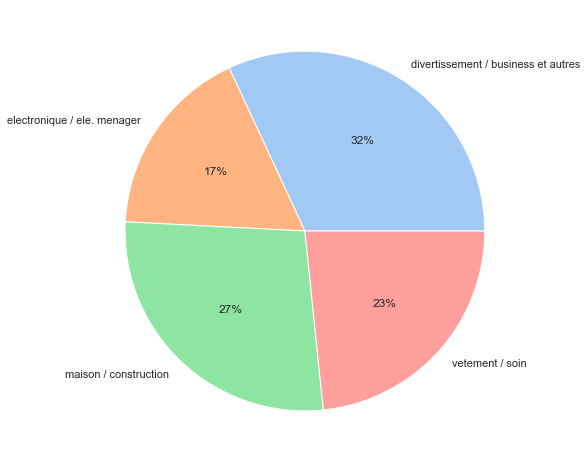

In [300]:
#define data
data = data_full.groupby(by = 'catégori cluster').size().values
labels = data_full.groupby(by = 'catégori cluster').size().index.values

#define Seaborn color palette to use
colors = sns.color_palette('pastel')[0:5]

#create pie chart
plt.pie(data, labels = labels, colors = colors, autopct='%.0f%%')
plt.show()

## Supprimer les valeurs inutiles et dupliquées

**Plus de précision sur les définitions des ID** : 
-  **order_id** représente l'identifiant d'une commande, qui peut comprendre plusieurs achats. Dans le cas ou plus d'un article est acheté, ils sont classés dans la variable **order_item_id** (1, 2, 3, ...). 
- **customer_id** semble représenter un identifiant client propre à la commande, il n'est donc pas vraiment utile de le conserver. Nous pouvons le constater en comparant len(df['customer_id'].unique()) et len(df['order_id'].unique())
- **customer_unique_id** est lui propre à un client même sur des commandes différentes.
- **review_id**, **seller_zip_code_prefix**,**customer_zip_code_prefix**, **product_category_name** ne nous servent plus rien

In [214]:
data_full = data_full.drop(columns = ['customer_id','product_id','product_category_name'])
data_full = data_full.drop(columns = ['customer_zip_code_prefix','review_id'])
data_full = data_full.drop(columns = ['seller_zip_code_prefix'])

In [215]:
import missingno as msno


<AxesSubplot:>

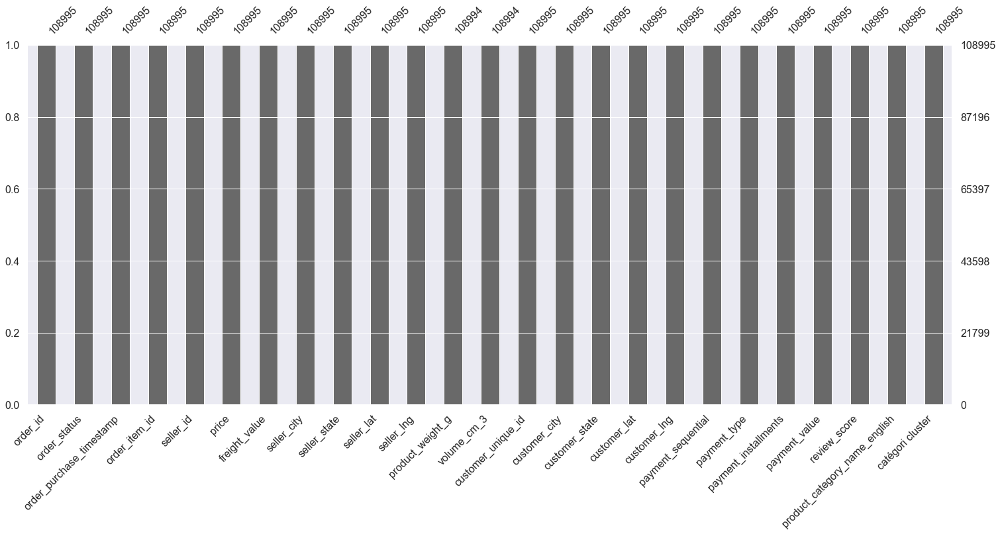

In [216]:
msno.bar(data_full)

In [217]:
# On supprime les deux lignes ou le produit n'est pas indiqué
data_full = data_full.dropna(axis=0)

In [218]:
# on formate les dates
data_full['order_purchase_timestamp'] =  pd.to_datetime(data_full['order_purchase_timestamp'])

In [219]:
data_full[data_full['order_purchase_timestamp'] == pd.to_datetime('2016-09-04 21:15:19')]

,order_id,order_status,order_purchase_timestamp,order_item_id,seller_id,price,freight_value,seller_city,seller_state,seller_lat,seller_lng,product_weight_g,volume_cm_3,customer_unique_id,customer_city,customer_state,customer_lat,customer_lng,payment_sequential,payment_type,payment_installments,payment_value,review_score,product_category_name_english,catégori cluster
32026,2e7a8482f6fb09756ca50c10d7bfc047,shipped,2016-09-04 21:15:19,1,1554a68530182680ad5c8b042c3ab563,39.99,31.67,monte siao,MG,-22.432149,-46.582346,1400.0,5376.0,b7d76e111c89f7ebf14761390f0f7d17,boa vista,RR,2.809871,-60.702822,1,credit_card,1,136.23,1,géneral maison,maison / construction
32027,2e7a8482f6fb09756ca50c10d7bfc047,shipped,2016-09-04 21:15:19,2,1554a68530182680ad5c8b042c3ab563,32.90,31.67,monte siao,MG,-22.432149,-46.582346,1800.0,5376.0,b7d76e111c89f7ebf14761390f0f7d17,boa vista,RR,2.809871,-60.702822,1,credit_card,1,136.23,1,géneral maison,maison / construction


# Analyse des ventes 

- Nous créons dans un premier temps un dataframe avec le nombre de ventes par jour par catégories

In [220]:
data_jour_aticles = data_full.copy()
data_jour_aticles = pd.DataFrame(data_jour_aticles.groupby(['product_category_name_english','order_purchase_timestamp'])['order_id']
                                 .count()).unstack(level=0).fillna(0)
data_jour_aticles.columns = data_jour_aticles.columns.droplevel()
data_jour_aticles

product_category_name_english,Soin,animaux jardin,arts,auto,business,construction,divertissement,electro ménager,electronique,géneral maison,livres,nouriture,other,vetement
order_purchase_timestamp,,,,,,,,,,,,,,
2016-09-04 21:15:19,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,0.0,0.0,0.0,0.0
2016-10-03 09:44:50,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
2016-10-03 16:56:50,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2016-10-03 21:13:36,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2016-10-03 22:06:03,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2018-08-29 14:18:23,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,0.0,0.0,0.0,0.0
2018-08-29 14:18:28,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2018-08-29 14:52:00,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [221]:
data_mois_article_benef = pd.DataFrame(columns = data_jour_aticles.columns)
days_start = data_jour_aticles.index[0].day - 1
start = data_jour_aticles.index[0] - pd.DateOffset(days=days_start)
while start < data_jour_aticles.index[-1]:
    end_month = start + pd.DateOffset(days=7)
    mask = (data_jour_aticles.index >= start) & (data_jour_aticles.index < end_month)
    data_mois_article_benef.loc[start] = data_jour_aticles[mask].sum().values
    
    start = end_month
    
data_mois_article_benef.head()

product_category_name_english,Soin,animaux jardin,arts,auto,business,construction,divertissement,electro ménager,electronique,géneral maison,livres,nouriture,other,vetement
2016-09-01 21:15:19,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,0.0,0.0,0.0,0.0
2016-09-08 21:15:19,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2016-09-15 21:15:19,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2016-09-22 21:15:19,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2016-09-29 21:15:19,41.0,4.0,0.0,6.0,3.0,0.0,22.0,8.0,17.0,38.0,0.0,0.0,13.0,10.0


#### Nous observons le nombres de vente par semaine 

In [60]:
import plotly.express as px 

fig = px.bar(data_mois_article_benef, x=data_mois_article_benef.index, y=data_mois_article_benef.columns)# data_mois_article.columns)
fig.show()

- Nous pouvons ici observer le pic de commande lors du **blackfriday** de 2017 (le 24 novembre)

#### Le chiffre d'affaire par semaine

- On considère le chiffre d'affaire comme la somme du prix du produit et des frais de ports

In [61]:
data_jour_aticles = data_full.copy()
data_jour_aticles = pd.DataFrame(data_jour_aticles.groupby(['product_category_name_english','order_purchase_timestamp'])['price','freight_value']
                                 .sum())
data_jour_aticles['total'] = data_jour_aticles['price'] + data_jour_aticles['freight_value']

data_jour_aticles.drop(columns= ['price','freight_value'], inplace = True)
data_jour_aticles = data_jour_aticles.unstack(level=0).fillna(0)
data_jour_aticles.columns = data_jour_aticles.columns.droplevel()


data_jour_aticles

C:\Users\pouru\AppData\Local\Temp/ipykernel_5532/3166074890.py:2: FutureWarning:

Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.



product_category_name_english,Soin,animaux jardin,arts,auto,business,construction,divertissement,electro ménager,electronique,géneral maison,livres,nouriture,other,vetement
order_purchase_timestamp,,,,,,,,,,,,,,
2016-09-04 21:15:19,0.00,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.00,136.23,0.0,0.0,0.0,0.00
2016-10-03 09:44:50,0.00,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.00,0.00,0.0,0.0,0.0,45.46
2016-10-03 16:56:50,0.00,0.0,0.0,0.0,0.0,0.0,39.09,0.0,0.00,0.00,0.0,0.0,0.0,0.00
2016-10-03 21:13:36,0.00,0.0,0.0,0.0,0.0,0.0,53.73,0.0,0.00,0.00,0.0,0.0,0.0,0.00
2016-10-03 22:06:03,0.00,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.00,133.46,0.0,0.0,0.0,0.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2018-08-29 14:18:23,0.00,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.00,510.96,0.0,0.0,0.0,0.00
2018-08-29 14:18:28,61.29,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.00,0.00,0.0,0.0,0.0,0.00
2018-08-29 14:52:00,0.00,0.0,0.0,0.0,0.0,0.0,33.23,0.0,0.00,0.00,0.0,0.0,0.0,0.00


In [62]:
data_mois_article_benef = pd.DataFrame(columns = data_jour_aticles.columns)
days_start = data_jour_aticles.index[0].day - 1
start = data_jour_aticles.index[0] - pd.DateOffset(days=days_start)
while start < data_jour_aticles.index[-1]:
    end_month = start + pd.DateOffset(days=7)
    mask = (data_jour_aticles.index >= start) & (data_jour_aticles.index < end_month)
    data_mois_article_benef.loc[start] = data_jour_aticles[mask].sum().values
    
    start = end_month
    
data_mois_article_benef

product_category_name_english,Soin,animaux jardin,arts,auto,business,construction,divertissement,electro ménager,electronique,géneral maison,livres,nouriture,other,vetement
2016-09-01 21:15:19,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,136.23,0.00,0.00,0.00,0.00
2016-09-08 21:15:19,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
2016-09-15 21:15:19,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
2016-09-22 21:15:19,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
2016-09-29 21:15:19,5413.48,596.51,0.00,1414.98,343.61,0.00,4414.64,1503.61,3708.70,3753.42,0.00,0.00,1454.62,1746.11
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2018-08-02 21:15:19,64831.87,17424.79,8863.97,18566.89,14045.47,16050.85,24824.15,13028.13,44917.70,73672.15,2515.08,4093.24,7430.75,35653.85
2018-08-09 21:15:19,51388.45,14354.21,3156.10,15521.99,9497.94,14106.25,30306.62,7353.50,36750.34,66806.78,955.70,3213.71,6044.77,33645.95
2018-08-16 21:15:19,44002.75,12169.97,3077.84,13910.48,6893.20,12752.87,16190.81,7385.18,22204.96,44834.67,680.78,3676.01,3445.31,16809.76
2018-08-23 21:15:19,11854.61,502.58,319.44,1489.95,2050.10,6830.78,3904.90,365.73,3148.16,11233.60,246.98,1569.34,741.36,3262.70


In [63]:
fig = px.bar(data_mois_article_benef, x=data_mois_article_benef.index, y=data_mois_article_benef.columns)# data_mois_article.columns)
fig.show()

#### Le chiffre d'affaire total par catégorie de produit

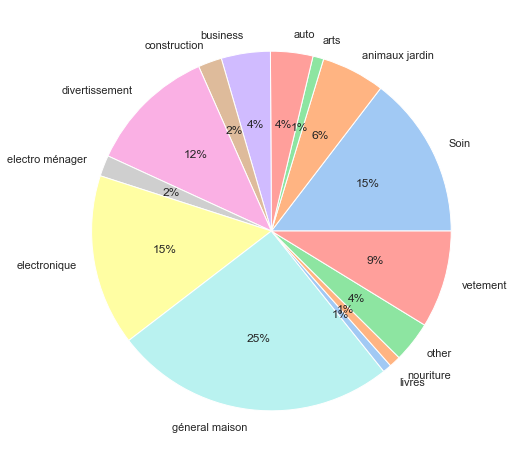

In [222]:
import seaborn as sns
sns.set(rc={'figure.figsize':(11.7,8.27)})
#define data
data = data_mois_article_benef.sum().values
labels = data_mois_article_benef.columns

#define Seaborn color palette to use
colors = sns.color_palette('pastel')[0:14]

#create pie chart
plt.pie(data, labels = labels, colors = colors, autopct='%.0f%%')
plt.show()


# Analyse des clients

- Nous proposons d'étudier les différents clients à l'aide de la segmentation RFM (réssence, fréquance, montant). Cella va nous donner un premier aperçu des profils présents dans la base.

## Segmentation RFM

La segmentation RFM prend en compte la Récence (date de la dernière commande), la Fréquence des commandes et le Montant (de la dernière commande ou sur une période donnée) pour établir des segments de clients homogènes.

In [255]:
data_full.to_csv('data_maj.csv') 

In [256]:
# Initialisation du dataframe  data_full customer_id

data_rfm = pd.DataFrame(columns=['customer_unique_id','récence','fréquence','montant'])

In [257]:
data_rfm['customer_unique_id'] = data_full['customer_unique_id'].unique()

In [258]:
data_rfm

,customer_unique_id,récence,fréquence,montant
0,7c396fd4830fd04220f754e42b4e5bff,NaN,NaN,NaN
1,3a51803cc0d012c3b5dc8b7528cb05f7,NaN,NaN,NaN
2,ef0996a1a279c26e7ecbd737be23d235,NaN,NaN,NaN
3,e781fdcc107d13d865fc7698711cc572,NaN,NaN,NaN
4,7a1de9bde89aedca8c5fbad489c5571c,NaN,NaN,NaN
...,...,...,...,...
91971,c5df80808db02b2e08abd92b9d964b9b,NaN,NaN,NaN
91972,9790c90c5b3a1a5237c11433331af1cb,NaN,NaN,NaN
91973,1de8fb735d8252498d9a2f82a68c57e0,NaN,NaN,NaN
91974,5f684afb3d1a02f2787e80cb0eee6e02,NaN,NaN,NaN


### Récence 

Pour chaque client nous associons un score de récence en fonction de la date de sa dernière commande

In [259]:
data_full_rec = data_full.sort_values(by = 'order_purchase_timestamp') 
data_full_rec = data_full_rec.drop_duplicates(subset='customer_unique_id', keep = 'last')
data_full_rec = data_full_rec[['customer_unique_id','order_purchase_timestamp']]
data_rfm =  pd.merge(data_rfm,data_full_rec, on="customer_unique_id")
data_rfm['récence'] = data_rfm['order_purchase_timestamp'].values
data_rfm = data_rfm.drop(columns = ['order_purchase_timestamp'])
data_rfm

,customer_unique_id,récence,fréquence,montant
0,7c396fd4830fd04220f754e42b4e5bff,2017-10-02 10:56:33,NaN,NaN
1,3a51803cc0d012c3b5dc8b7528cb05f7,2017-08-15 18:29:31,NaN,NaN
2,ef0996a1a279c26e7ecbd737be23d235,2017-08-02 18:24:47,NaN,NaN
3,e781fdcc107d13d865fc7698711cc572,2017-10-23 23:26:46,NaN,NaN
4,7a1de9bde89aedca8c5fbad489c5571c,2017-12-02 15:16:36,NaN,NaN
...,...,...,...,...
91971,c5df80808db02b2e08abd92b9d964b9b,2018-07-03 10:10:12,NaN,NaN
91972,9790c90c5b3a1a5237c11433331af1cb,2018-07-05 16:25:40,NaN,NaN
91973,1de8fb735d8252498d9a2f82a68c57e0,2018-05-16 14:50:54,NaN,NaN
91974,5f684afb3d1a02f2787e80cb0eee6e02,2018-06-13 12:19:26,NaN,NaN


In [260]:
min_date = data_rfm['récence'].min()
max_date = data_rfm['récence'].max()

In [261]:
min_date - max_date

Timedelta('-729 days +12:08:22')

In [262]:
# on peut constater qu'il y a une différence de 729 jours entre les deux dates 

data_rfm['récence'] = data_rfm['récence'] - max_date

# Maintenent nous plaçons un seuil subjectif :
# - note de 3 si le dernier achat est inférieur à 6 mois pd.Timedelta(-182, "d")
# - note de 2 si le dernier achat est inférieur à 1 ans pd.Timedelta(-547, "d")
# - note de 1 sinon
def lambda_recence(x):
    if x > pd.Timedelta(-182, "d") : 
        return 3
    elif x > pd.Timedelta(-547, "d") : 
        return 2
    else :
        return 1
    
data_rfm['récence'] = data_rfm['récence'].apply(lambda_recence)

from tqdm import tqdm
for i in tqdm(range(data_rfm.shape[0])):
    if data_rfm['récence'][i] > pd.Timedelta(-182, "d") : 
        data_rfm['récence'][i] = 3
    elif data_rfm['récence'][i] > pd.Timedelta(-547, "d") : 
        data_rfm['récence'][i] = 2
    else :
        data_rfm['récence'][i] = 1

In [263]:
data_rfm

,customer_unique_id,récence,fréquence,montant
0,7c396fd4830fd04220f754e42b4e5bff,2,NaN,NaN
1,3a51803cc0d012c3b5dc8b7528cb05f7,2,NaN,NaN
2,ef0996a1a279c26e7ecbd737be23d235,2,NaN,NaN
3,e781fdcc107d13d865fc7698711cc572,2,NaN,NaN
4,7a1de9bde89aedca8c5fbad489c5571c,2,NaN,NaN
...,...,...,...,...
91971,c5df80808db02b2e08abd92b9d964b9b,3,NaN,NaN
91972,9790c90c5b3a1a5237c11433331af1cb,3,NaN,NaN
91973,1de8fb735d8252498d9a2f82a68c57e0,3,NaN,NaN
91974,5f684afb3d1a02f2787e80cb0eee6e02,3,NaN,NaN


### fréquence 

**Nous analysons le nombre de fois que les client on passés une commande**

In [264]:
# On garde uniquement les colonnes qui nous intéressent
nb_commandes_client = data_full[['order_id','customer_unique_id']]

In [265]:
# On supprime les lignes dupliquées pour les cas ou il y a plusieurs articles
nb_commandes_client.drop_duplicates(keep = 'first', inplace = True)

In [266]:
nb_commandes_client = pd.DataFrame(nb_commandes_client.groupby(by = ['customer_unique_id'])['order_id'].count()).reset_index()

In [267]:
nb_commandes_client

,customer_unique_id,order_id
0,0000366f3b9a7992bf8c76cfdf3221e2,1
1,0000b849f77a49e4a4ce2b2a4ca5be3f,1
2,0000f46a3911fa3c0805444483337064,1
3,0000f6ccb0745a6a4b88665a16c9f078,1
4,0004aac84e0df4da2b147fca70cf8255,1
...,...,...
91971,fffcf5a5ff07b0908bd4e2dbc735a684,1
91972,fffea47cd6d3cc0a88bd621562a9d061,1
91973,ffff371b4d645b6ecea244b27531430a,1
91974,ffff5962728ec6157033ef9805bacc48,1


In [268]:
nb_commandes_client

,customer_unique_id,order_id
0,0000366f3b9a7992bf8c76cfdf3221e2,1
1,0000b849f77a49e4a4ce2b2a4ca5be3f,1
2,0000f46a3911fa3c0805444483337064,1
3,0000f6ccb0745a6a4b88665a16c9f078,1
4,0004aac84e0df4da2b147fca70cf8255,1
...,...,...
91971,fffcf5a5ff07b0908bd4e2dbc735a684,1
91972,fffea47cd6d3cc0a88bd621562a9d061,1
91973,ffff371b4d645b6ecea244b27531430a,1
91974,ffff5962728ec6157033ef9805bacc48,1


In [269]:
nb_commandes_client.groupby(by = ['order_id'])['customer_unique_id'].count()

order_id
1     89235
2      2524
3       171
4        29
5         9
6         3
7         3
9         1
15        1
Name: customer_unique_id, dtype: int64

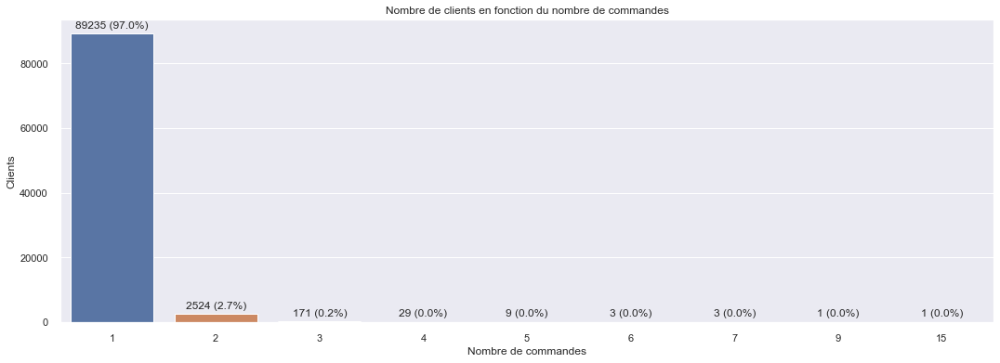

In [270]:
top_10 = nb_commandes_client.groupby(by = ['order_id'])['customer_unique_id'].count()
plt.figure(figsize=(18,6))
ax = sns.barplot(x=top_10.index, y=top_10.values)

sum_poucent = 0
for p in ax.patches:
    pourcent = format(100*p.get_height()/len(nb_commandes_client),'.1f')
    a = 100*p.get_height()/len(nb_commandes_client)
    text = str(int(p.get_height())) + ' ('+str(pourcent)+'%)'
    ax.annotate(text, 
                (p.get_x() + p.get_width() / 2., p.get_height()), 
                ha = 'center', va = 'center', 
                xytext = (0, 9), 
                textcoords = 'offset points')
    sum_poucent = sum_poucent + a

plt.title("Nombre de clients en fonction du nombre de commandes")
plt.xlabel("Nombre de commandes")
plt.ylabel('Clients')
plt.show()

**Nous retrouvons donc comme indiqué dans le mail que seulement 3% des clients ont effectués plus d'une commande**

In [271]:
# Nous distinguons donc ces deux cas en attribuant la note de 1 ou 2 aux clients
nb_commandes_client = nb_commandes_client.rename(columns={"order_id": "nb_commandes"})
nb_commandes_client

,customer_unique_id,nb_commandes
0,0000366f3b9a7992bf8c76cfdf3221e2,1
1,0000b849f77a49e4a4ce2b2a4ca5be3f,1
2,0000f46a3911fa3c0805444483337064,1
3,0000f6ccb0745a6a4b88665a16c9f078,1
4,0004aac84e0df4da2b147fca70cf8255,1
...,...,...
91971,fffcf5a5ff07b0908bd4e2dbc735a684,1
91972,fffea47cd6d3cc0a88bd621562a9d061,1
91973,ffff371b4d645b6ecea244b27531430a,1
91974,ffff5962728ec6157033ef9805bacc48,1


In [272]:
def lambda_2(x):
    res = 1
    if x > 1 :
        res = 2
    return res

nb_commandes_client['nb_commandes'] = nb_commandes_client['nb_commandes'].apply(lambda_2)


In [273]:
nb_commandes_client

,customer_unique_id,nb_commandes
0,0000366f3b9a7992bf8c76cfdf3221e2,1
1,0000b849f77a49e4a4ce2b2a4ca5be3f,1
2,0000f46a3911fa3c0805444483337064,1
3,0000f6ccb0745a6a4b88665a16c9f078,1
4,0004aac84e0df4da2b147fca70cf8255,1
...,...,...
91971,fffcf5a5ff07b0908bd4e2dbc735a684,1
91972,fffea47cd6d3cc0a88bd621562a9d061,1
91973,ffff371b4d645b6ecea244b27531430a,1
91974,ffff5962728ec6157033ef9805bacc48,1


In [274]:
# Il faut alors merger ce dataframe avec le rfm

data_rfm =  pd.merge(data_rfm, nb_commandes_client, on="customer_unique_id")

In [275]:
data_rfm = data_rfm.drop(columns = ['fréquence'])

In [276]:
data_rfm = data_rfm.rename(columns={"nb_commandes": "fréquence"})
data_rfm

,customer_unique_id,récence,montant,fréquence
0,7c396fd4830fd04220f754e42b4e5bff,2,NaN,2
1,3a51803cc0d012c3b5dc8b7528cb05f7,2,NaN,1
2,ef0996a1a279c26e7ecbd737be23d235,2,NaN,1
3,e781fdcc107d13d865fc7698711cc572,2,NaN,1
4,7a1de9bde89aedca8c5fbad489c5571c,2,NaN,2
...,...,...,...,...
91971,c5df80808db02b2e08abd92b9d964b9b,3,NaN,1
91972,9790c90c5b3a1a5237c11433331af1cb,3,NaN,1
91973,1de8fb735d8252498d9a2f82a68c57e0,3,NaN,1
91974,5f684afb3d1a02f2787e80cb0eee6e02,3,NaN,1


### Montant 

Nous calculons ici le montant total par clients. (prix de l'article plus frais de port)

In [277]:
data_rfm_montant = data_full[['price','freight_value','customer_unique_id']]

In [278]:
data_rfm_montant['prix_total'] = data_rfm_montant['price'] + data_rfm_montant['freight_value'] 
data_rfm_montant.drop(columns = ['price','freight_value'], inplace = True)

In [279]:
data_rfm_montant = data_rfm_montant.groupby(by = 'customer_unique_id')['prix_total'].sum()

In [280]:
data_rfm_montant = pd.DataFrame(data_rfm_montant).reset_index()

In [281]:
data_rfm =  pd.merge(data_rfm, data_rfm_montant, on="customer_unique_id")

In [282]:
data_rfm = data_rfm.drop(columns = ['montant'])
data_rfm = data_rfm.rename(columns={"prix_total": "montant"})
data_rfm

,customer_unique_id,récence,fréquence,montant
0,7c396fd4830fd04220f754e42b4e5bff,2,2,82.82
1,3a51803cc0d012c3b5dc8b7528cb05f7,2,1,37.77
2,ef0996a1a279c26e7ecbd737be23d235,2,1,37.77
3,e781fdcc107d13d865fc7698711cc572,2,1,44.09
4,7a1de9bde89aedca8c5fbad489c5571c,2,2,467.00
...,...,...,...,...
91971,c5df80808db02b2e08abd92b9d964b9b,3,1,168.72
91972,9790c90c5b3a1a5237c11433331af1cb,3,1,63.41
91973,1de8fb735d8252498d9a2f82a68c57e0,3,1,66.38
91974,5f684afb3d1a02f2787e80cb0eee6e02,3,1,31.42


#### Nous étudions ensuite la répartition des montants pour définir les seuils d'attribution des notes (1, 2 ou 3)

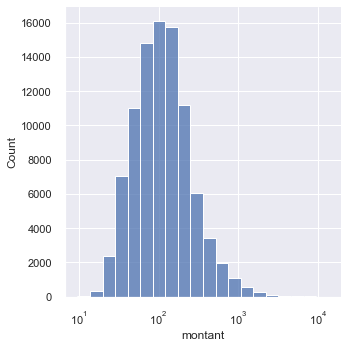

In [283]:
sns.displot(data_rfm, x="montant", bins=20, log_scale=True,)

In [284]:
# étude des tiertiles 
print(np.quantile(data_rfm['montant'].values, .33) )
print(np.quantile(data_rfm['montant'].values, .66) )

74.51
149.63


Nous decidons d'attribuer la note de 3 si le montant est > 150, la note de 2 si > 75 et 3 sinon

In [285]:
def lambda_tiertiles(x):
    res = 1
    if x > 150 :
        res = 3
    elif x > 75 :
        res = 2
    return res

data_rfm['montant'] = data_rfm['montant'].apply(lambda_tiertiles)

In [286]:
data_rfm

,customer_unique_id,récence,fréquence,montant
0,7c396fd4830fd04220f754e42b4e5bff,2,2,2
1,3a51803cc0d012c3b5dc8b7528cb05f7,2,1,1
2,ef0996a1a279c26e7ecbd737be23d235,2,1,1
3,e781fdcc107d13d865fc7698711cc572,2,1,1
4,7a1de9bde89aedca8c5fbad489c5571c,2,2,3
...,...,...,...,...
91971,c5df80808db02b2e08abd92b9d964b9b,3,1,3
91972,9790c90c5b3a1a5237c11433331af1cb,3,1,1
91973,1de8fb735d8252498d9a2f82a68c57e0,3,1,1
91974,5f684afb3d1a02f2787e80cb0eee6e02,3,1,1


## Associer un profil aux clients en fonction de son score RFM

Il y a 18 combianaisons possibles :
    - 3 pour la récence ( 1 : inactif, 2 : standard, 3 : actif)
    - 2 pour la fréquence (1 : unique, 2 : fréquent)
    - 3 pour le montant (1 : faible, 2 : standard, 3 : dépensier)

* MEILLEUR "323" - les plus récents, les plus fréquents, les plus générateurs de revenus - les clients de base qui doivent être considérés comme les clients les plus précieux.


* DISPARU - '111', '112', '113' -  des clients uniques il y a longtemps- ces clients ont probablement disparu.


* NOUVEAU - '311', '312', '313' - viennent de s'inscrire - nouveaux clients qui se sont inscrits récemment 


* DEPENSIER - '213', '223 - les plus générateurs de revenus - ceux qui génèrent les plus gros revenus et qui ne sont pas inactifs.


* REGULIER - '221', '222', '321', '322', - utilisateurs fidèles ayant commandés aux moins deux fois, avec une commande relativement récente


* DEÇU -  '121', '123','122', , - utilisateurs ayant passés plusieurs commandes mais qui n'ont pas recommandés depuis longtemps. On peut supposer qu'il ont était peu satifait de leurs dernières commandes et qu'il sont allés chez la concurence.

* STANDARD - '212', '211' rien à déclarer sur ces utilisateurs, commande ni trés récente ni anciènne, montant peu élevés



In [287]:
data_rfm['rfm_score'] = data_rfm['récence'].apply(str) + \
                   data_rfm['fréquence'].apply(str) + \
                   data_rfm['montant'].apply(str)

In [288]:
data_rfm

,customer_unique_id,récence,fréquence,montant,rfm_score
0,7c396fd4830fd04220f754e42b4e5bff,2,2,2,222
1,3a51803cc0d012c3b5dc8b7528cb05f7,2,1,1,211
2,ef0996a1a279c26e7ecbd737be23d235,2,1,1,211
3,e781fdcc107d13d865fc7698711cc572,2,1,1,211
4,7a1de9bde89aedca8c5fbad489c5571c,2,2,3,223
...,...,...,...,...,...
91971,c5df80808db02b2e08abd92b9d964b9b,3,1,3,313
91972,9790c90c5b3a1a5237c11433331af1cb,3,1,1,311
91973,1de8fb735d8252498d9a2f82a68c57e0,3,1,1,311
91974,5f684afb3d1a02f2787e80cb0eee6e02,3,1,1,311


In [289]:
def segmentize(x):
    if x == '323':
        return 'MEILLEUR'
    elif x in ['111', '112', '113']:
        return 'DISPARU'
    elif x in ['311', '312', '313']:
        return 'NOUVEAU'
    elif x in ['213', '223']:
        return 'DEPENSIER'
    elif x in ['221', '222', '321', '322']:
        return 'REGULIER'
    elif x in ['121', '123','122']:
        return 'DEÇU'
    else : 
        return 'STANDARD'

In [290]:
data_rfm['profil client'] = data_rfm['rfm_score'].apply(segmentize)

In [291]:
data_rfm

,customer_unique_id,récence,fréquence,montant,rfm_score,profil client
0,7c396fd4830fd04220f754e42b4e5bff,2,2,2,222,REGULIER
1,3a51803cc0d012c3b5dc8b7528cb05f7,2,1,1,211,STANDARD
2,ef0996a1a279c26e7ecbd737be23d235,2,1,1,211,STANDARD
3,e781fdcc107d13d865fc7698711cc572,2,1,1,211,STANDARD
4,7a1de9bde89aedca8c5fbad489c5571c,2,2,3,223,DEPENSIER
...,...,...,...,...,...,...
91971,c5df80808db02b2e08abd92b9d964b9b,3,1,3,313,NOUVEAU
91972,9790c90c5b3a1a5237c11433331af1cb,3,1,1,311,NOUVEAU
91973,1de8fb735d8252498d9a2f82a68c57e0,3,1,1,311,NOUVEAU
91974,5f684afb3d1a02f2787e80cb0eee6e02,3,1,1,311,NOUVEAU


In [294]:
data_rfm['profil client'].value_counts(ascending=True)

DEÇU            58
REGULIER       636
MEILLEUR       909
DISPARU       2706
DEPENSIER    17244
STANDARD     34374
NOUVEAU      36049
Name: profil client, dtype: int64

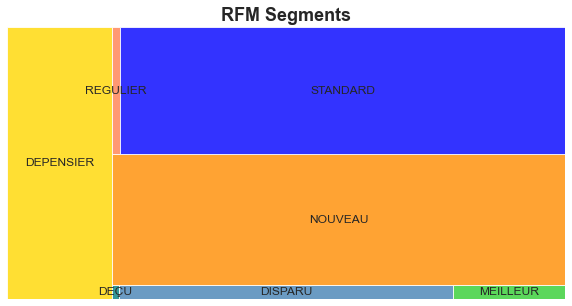

In [299]:
group_per = pd.DataFrame(data_rfm.groupby(by = ['profil client'])['customer_unique_id'].count()).reset_index()
group_per['pourcent'] = 100 * group_per['customer_unique_id'] / group_per['customer_unique_id'].sum()

import squarify


fig = plt.gcf()
ax = fig.add_subplot()
fig.set_size_inches(10, 5)
squarify.plot(sizes = group_per['customer_unique_id'], 
              label = group_per['profil client'],
              color = ['gold', 'teal', 'steelblue',
                       'limegreen', 'darkorange', 'coral',
                       'blue', 'red','yellow'],
              alpha = 0.8)
plt.title("RFM Segments",fontsize=18,fontweight="bold")
plt.axis('off')
plt.show()

### Visualisation CPA 
Pour nous familliariser avec l'analyse en composante principale nous proposons de représenter la segmentation RFM sur un plan
où un point représente un client et sa couleur son profil

In [103]:
# éliminer les colonnes que nous n'utiliserons pas
data_rfm_cpa = data_rfm.drop(['customer_unique_id', 'rfm_score', 'profil client'], axis=1)
data_rfm_cpa_val = data_rfm_cpa.values
# Nous normalisons nos données
std_scale = preprocessing.StandardScaler().fit(data_rfm_cpa_val)
data_rfm_cpa_scaled = std_scale.transform(data_rfm_cpa_val)
# Calcul des composantes principales
pca_frm = decomposition.PCA(n_components=2)
pca_frm.fit(data_rfm_cpa_scaled)

PCA(n_components=2)

In [104]:
# variance expliquée par les deux composantes
print(pca_frm.explained_variance_ratio_)
# somme
print(pca_frm.explained_variance_ratio_.sum())

[0.38555698 0.33235744]
0.7179144154050507


In [105]:
# Nous projettons les données dans la base des deux composantes principales
data_rfm_cpa_projected = pca_frm.transform(data_rfm_cpa_scaled)

In [106]:
d = {'col1': data_rfm_cpa_projected.T[0], 'col2': data_rfm_cpa_projected.T[1]}
df_rfm_cpa_projected = pd.DataFrame(data=d)

In [107]:
df_rfm_cpa_projected['profil client'] = data_rfm['profil client']

In [108]:
df_rfm_cpa_projected

,col1,col2,profil client
0,3.886029,1.359501,REGULIER
1,-1.081041,0.568144,STANDARD
2,-1.081041,0.568144,STANDARD
3,-1.081041,0.568144,STANDARD
4,4.742872,1.453739,DEPENSIER
...,...,...,...
91971,0.887688,-1.067770,NOUVEAU
91972,-0.825998,-1.256245,NOUVEAU
91973,-0.825998,-1.256245,NOUVEAU
91974,-0.825998,-1.256245,NOUVEAU


<AxesSubplot:xlabel='col1', ylabel='col2'>

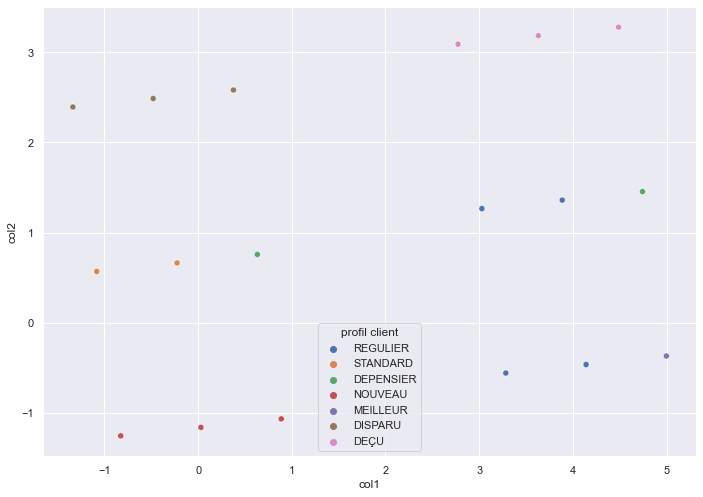

In [109]:
sns.scatterplot(data=df_rfm_cpa_projected, x="col1", y="col2", hue="profil client")

(-1.1, 1.1)

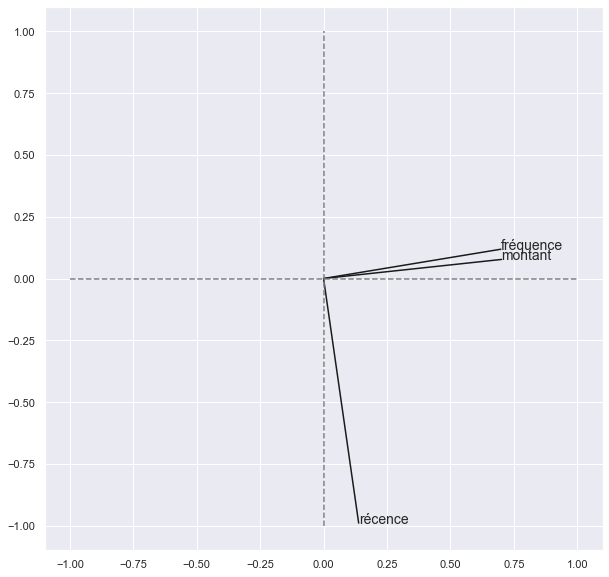

In [110]:
# representation des axes (ici nous sommes passés de seulement 3 à 2 dimensions mais c'est un exemple )
# On pouras constater que le premier axe représente la fréquence et le montant et que le 2eme représente la récence

pcs = pca_frm.components_
plt.figure(figsize=(10,10))
for i, (x, y) in enumerate(zip(pcs[0, :], pcs[1, :])):
    # Afficher un segment de l'origine au point (x, y)
    plt.plot([0, x], [0, y], color='k')
    # Afficher le nom (data.columns[i]) de la performance
    plt.text(x, y, data_rfm_cpa.columns[i], fontsize='14')

# Afficher une ligne horizontale y=0
plt.plot([-1, 1], [0, 0], color='grey', ls='--')

# Afficher une ligne verticale x=0
plt.plot([0, 0], [-1, 1], color='grey', ls='--')

plt.xlim([-1.1, 1.1])
plt.ylim([-1.1, 1.1])


# Création du data frame complet pour faire les clusterings

Nous devons agréger de multiples informations pour mettre en place les méthodes non supervisées.
Nous allons créer un dataframe avec 'custumer_unique_id' et lui apporter les informations suivantes : 
- La date de la première commande
- Le nombre de jours entre la première et la dernière commande
- La somme des dépenses.
- La région du vendeur le plus présent avec sa latitude/longitude
- Le poid moyen des articles achetés
- Le volume moyen des artives achetés
- La région du client et sa longitude/latitude
    - Le nombre de payment_installments moyen
    - La note de satifaction moyenne
    - Le moyen de paiement le plus utilisé
    - le nombre d'article acheté par catégories

Une fois toutes ces données agrégées nous réaliserons une ACP en colorant les points en fonction du profil client obtenu par la RFM.

### Les dates

In [111]:
data_cluster = pd.DataFrame(data_rfm['customer_unique_id'])

In [112]:
# date de la première et dernière commande
col_date1 = data_full.sort_values(by = 'order_purchase_timestamp', ascending=True)[['customer_unique_id','order_purchase_timestamp']]
col_date1 = col_date1.drop_duplicates(subset='customer_unique_id')

# date de la dernière commande
col_date_last = data_full.sort_values(by = 'order_purchase_timestamp', ascending=False)[['customer_unique_id','order_purchase_timestamp']]
col_date_last = col_date_last.drop_duplicates(subset='customer_unique_id')

In [113]:
col_date1 =  pd.merge(col_date1, col_date_last, on="customer_unique_id")

In [114]:
col_date1

,customer_unique_id,order_purchase_timestamp_x,order_purchase_timestamp_y
0,b7d76e111c89f7ebf14761390f0f7d17,2016-09-04 21:15:19,2016-09-04 21:15:19
1,32ea3bdedab835c3aa6cb68ce66565ef,2016-10-03 09:44:50,2018-06-28 11:46:04
2,2f64e403852e6893ae37485d5fcacdaf,2016-10-03 16:56:50,2016-10-03 16:56:50
3,61db744d2f835035a5625b59350c6b63,2016-10-03 21:13:36,2016-10-03 21:13:36
4,8d3a54507421dbd2ce0a1d58046826e0,2016-10-03 22:06:03,2016-10-03 22:06:03
...,...,...,...
91971,7a22d14aa3c3599238509ddca4b93b01,2018-08-29 12:25:59,2018-08-29 12:25:59
91972,5c58de6fb80e93396e2f35642666b693,2018-08-29 14:18:23,2018-08-29 14:18:23
91973,7febafa06d9d8f232a900a2937f04338,2018-08-29 14:18:28,2018-08-29 14:18:28
91974,b701bebbdf478f5500348f03aff62121,2018-08-29 14:52:00,2018-08-29 14:52:00


In [115]:
col_date1['delta_date'] = (col_date1['order_purchase_timestamp_y']  - col_date1['order_purchase_timestamp_x'])

In [116]:
col_date1 =col_date1[['customer_unique_id', 'order_purchase_timestamp_x',  'delta_date']] 

In [117]:
col_date1 = col_date1.rename(columns={"order_purchase_timestamp_x": "premier achat"})

In [118]:
def lambda_days(date):
    return date.days

col_date1['delta_date'] = col_date1['delta_date'].apply(lambda_days)

In [119]:
col_date1

,customer_unique_id,premier achat,delta_date
0,b7d76e111c89f7ebf14761390f0f7d17,2016-09-04 21:15:19,0
1,32ea3bdedab835c3aa6cb68ce66565ef,2016-10-03 09:44:50,633
2,2f64e403852e6893ae37485d5fcacdaf,2016-10-03 16:56:50,0
3,61db744d2f835035a5625b59350c6b63,2016-10-03 21:13:36,0
4,8d3a54507421dbd2ce0a1d58046826e0,2016-10-03 22:06:03,0
...,...,...,...
91971,7a22d14aa3c3599238509ddca4b93b01,2018-08-29 12:25:59,0
91972,5c58de6fb80e93396e2f35642666b693,2018-08-29 14:18:23,0
91973,7febafa06d9d8f232a900a2937f04338,2018-08-29 14:18:28,0
91974,b701bebbdf478f5500348f03aff62121,2018-08-29 14:52:00,0


In [120]:
data_full_rec = data_full.sort_values(by = 'order_purchase_timestamp') 
data_full_rec = data_full_rec.drop_duplicates(subset='customer_unique_id', keep = 'last')
data_full_rec = data_full_rec[['customer_unique_id','order_purchase_timestamp']]
col_date1 =  pd.merge(col_date1,data_full_rec, on="customer_unique_id")
col_date1['récence'] = col_date1['order_purchase_timestamp'].values
col_date1 = col_date1.drop(columns = ['order_purchase_timestamp'])

min_date = col_date1['récence'].min()
max_date = col_date1['récence'].max()

col_date1['récence'] = col_date1['récence'] - max_date


In [121]:
col_date1

,customer_unique_id,premier achat,delta_date,récence
0,b7d76e111c89f7ebf14761390f0f7d17,2016-09-04 21:15:19,0,-729 days +12:08:22
1,32ea3bdedab835c3aa6cb68ce66565ef,2016-10-03 09:44:50,633,-67 days +02:39:07
2,2f64e403852e6893ae37485d5fcacdaf,2016-10-03 16:56:50,0,-700 days +07:49:53
3,61db744d2f835035a5625b59350c6b63,2016-10-03 21:13:36,0,-700 days +12:06:39
4,8d3a54507421dbd2ce0a1d58046826e0,2016-10-03 22:06:03,0,-700 days +12:59:06
...,...,...,...,...
91971,7a22d14aa3c3599238509ddca4b93b01,2018-08-29 12:25:59,0,-5 days +03:19:02
91972,5c58de6fb80e93396e2f35642666b693,2018-08-29 14:18:23,0,-5 days +05:11:26
91973,7febafa06d9d8f232a900a2937f04338,2018-08-29 14:18:28,0,-5 days +05:11:31
91974,b701bebbdf478f5500348f03aff62121,2018-08-29 14:52:00,0,-5 days +05:45:03


In [122]:
col_date1['récence'] = col_date1['récence'].apply(lambda_days)

In [123]:
col_date1['premier achat'] = (col_date1['premier achat'] - max_date).apply(lambda_days)

In [124]:
col_date1

,customer_unique_id,premier achat,delta_date,récence
0,b7d76e111c89f7ebf14761390f0f7d17,-729,0,-729
1,32ea3bdedab835c3aa6cb68ce66565ef,-700,633,-67
2,2f64e403852e6893ae37485d5fcacdaf,-700,0,-700
3,61db744d2f835035a5625b59350c6b63,-700,0,-700
4,8d3a54507421dbd2ce0a1d58046826e0,-700,0,-700
...,...,...,...,...
91971,7a22d14aa3c3599238509ddca4b93b01,-5,0,-5
91972,5c58de6fb80e93396e2f35642666b693,-5,0,-5
91973,7febafa06d9d8f232a900a2937f04338,-5,0,-5
91974,b701bebbdf478f5500348f03aff62121,-5,0,-5


### La somme des dépenses

In [125]:
data_rfm_montant = data_full[['price','freight_value','customer_unique_id']]
data_rfm_montant['prix_total'] = data_rfm_montant['price'] + data_rfm_montant['freight_value'] 
data_rfm_montant.drop(columns = ['price','freight_value'], inplace = True)
data_rfm_montant = data_rfm_montant.groupby(by = 'customer_unique_id')['prix_total'].sum()
data_rfm_montant = pd.DataFrame(data_rfm_montant).reset_index()

C:\Users\pouru\AppData\Roaming\Python\Python39\site-packages\pandas\core\frame.py:3607: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\pouru\AppData\Roaming\Python\Python39\site-packages\pandas\core\frame.py:4901: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [126]:
data_rfm_montant

,customer_unique_id,prix_total
0,0000366f3b9a7992bf8c76cfdf3221e2,141.90
1,0000b849f77a49e4a4ce2b2a4ca5be3f,27.19
2,0000f46a3911fa3c0805444483337064,86.22
3,0000f6ccb0745a6a4b88665a16c9f078,43.62
4,0004aac84e0df4da2b147fca70cf8255,196.89
...,...,...
91971,fffcf5a5ff07b0908bd4e2dbc735a684,2067.42
91972,fffea47cd6d3cc0a88bd621562a9d061,84.58
91973,ffff371b4d645b6ecea244b27531430a,112.46
91974,ffff5962728ec6157033ef9805bacc48,133.69


### Le meilleur vendeur par client

In [127]:
# On trouve le plus gros vendeur par client
best_seller = data_full[['seller_id','customer_unique_id']]
best_seller["fake"] = [1]*best_seller.shape[0]
best_seller = best_seller.astype({"fake": int})
best_seller

C:\Users\pouru\AppData\Roaming\Python\Python39\site-packages\pandas\core\frame.py:3607: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,seller_id,customer_unique_id,fake
0,3504c0cb71d7fa48d967e0e4c94d59d9,7c396fd4830fd04220f754e42b4e5bff,1
1,3504c0cb71d7fa48d967e0e4c94d59d9,3a51803cc0d012c3b5dc8b7528cb05f7,1
2,3504c0cb71d7fa48d967e0e4c94d59d9,ef0996a1a279c26e7ecbd737be23d235,1
3,3504c0cb71d7fa48d967e0e4c94d59d9,e781fdcc107d13d865fc7698711cc572,1
4,3504c0cb71d7fa48d967e0e4c94d59d9,7a1de9bde89aedca8c5fbad489c5571c,1
...,...,...,...
108990,7c5b05cbdb5542049f38d90d7815b97d,c5df80808db02b2e08abd92b9d964b9b,1
108991,7c5b05cbdb5542049f38d90d7815b97d,9790c90c5b3a1a5237c11433331af1cb,1
108992,7c5b05cbdb5542049f38d90d7815b97d,1de8fb735d8252498d9a2f82a68c57e0,1
108993,7c5b05cbdb5542049f38d90d7815b97d,5f684afb3d1a02f2787e80cb0eee6e02,1


In [128]:
best_seller = pd.DataFrame(best_seller.groupby(['seller_id','customer_unique_id']).count())['fake'].unstack(level=0).fillna(0)

In [129]:
best_seller = pd.DataFrame(best_seller.idxmax(axis=1)).rename(columns = {0 : 'seller_id'})


In [130]:
best_seller = best_seller.reset_index()

In [131]:
best_seller = pd.merge(best_seller, data_full[['seller_id','seller_state','seller_city','seller_lat','seller_lng']], on="seller_id")

In [132]:
best_seller = best_seller.drop_duplicates()

In [133]:
best_seller

,customer_unique_id,seller_id,seller_state,seller_city,seller_lat,seller_lng
0,0000366f3b9a7992bf8c76cfdf3221e2,da8622b14eb17ae2831f4ac5b9dab84a,SP,piracicaba,-22.714922,-47.655772
1566,000de6019bb59f34c099a907c151d855,da8622b14eb17ae2831f4ac5b9dab84a,SP,piracicaba,-22.714922,-47.655772
3132,003c457932a554e4df13834237b1ed00,da8622b14eb17ae2831f4ac5b9dab84a,SP,piracicaba,-22.714922,-47.655772
4698,010ab6653f042ebb8e430f1718f61147,da8622b14eb17ae2831f4ac5b9dab84a,SP,piracicaba,-22.714922,-47.655772
6264,016a5760b723a3a0bcb4b294d4bc6b45,da8622b14eb17ae2831f4ac5b9dab84a,SP,piracicaba,-22.714922,-47.655772
...,...,...,...,...,...,...
39126566,fd4f1bb778159835b762d9e0a19de23f,6624bc09786f0e41ae48dfc5eeb1a9e2,MG,belo horizonte,-20.000254,-43.970582
39126567,fda4476abb6307ab3c415b7e6d026526,5996cddab893a4652a15592fb58ab8db,SP,presidente prudente,-22.123157,-51.388812
39126568,fe2222908d7d7dc8e03d0efea168a474,3a3c180dd702a725bd0ba4117689239e,PR,uniao da vitoria,-26.244618,-51.091669
39126569,fe253e9ecb2bc4496544e4fdf1bf4c56,c8665a4dd081a2c436b1cd921079d0d9,SP,pitangueiras,-21.002619,-48.218155


### La région du client et sa longitude/latitude

In [134]:
infos_client = data_full[['customer_unique_id','customer_city','customer_state','customer_lat','customer_lng']]
infos_client = infos_client.drop_duplicates(subset =['customer_unique_id'])
infos_client

,customer_unique_id,customer_city,customer_state,customer_lat,customer_lng
0,7c396fd4830fd04220f754e42b4e5bff,sao paulo,SP,-23.583452,-46.586284
1,3a51803cc0d012c3b5dc8b7528cb05f7,sao paulo,SP,-23.564977,-46.536043
2,ef0996a1a279c26e7ecbd737be23d235,sao paulo,SP,-23.532175,-46.626106
3,e781fdcc107d13d865fc7698711cc572,florianopolis,SC,-27.553442,-48.500027
4,7a1de9bde89aedca8c5fbad489c5571c,sao paulo,SP,-23.555460,-46.639994
...,...,...,...,...,...
108989,c5df80808db02b2e08abd92b9d964b9b,belem,PA,-1.463764,-48.488360
108991,9790c90c5b3a1a5237c11433331af1cb,paranagua,PR,-25.521533,-48.528872
108992,1de8fb735d8252498d9a2f82a68c57e0,ribeirao pires,SP,-23.721535,-46.390913
108993,5f684afb3d1a02f2787e80cb0eee6e02,sao paulo,SP,-23.498814,-46.705270


### Le poids, volume, payment_installments,satifaction  moyen des articles achetés par clients


In [135]:
volume_prix_moyen = data_full[['customer_unique_id','product_weight_g','volume_cm_3','review_score','payment_installments']]

In [136]:
volume_prix_moyen = volume_prix_moyen.groupby(by = ['customer_unique_id'])[['product_weight_g','volume_cm_3','review_score','payment_installments']].mean()

In [137]:
volume_prix_moyen = volume_prix_moyen.reset_index()

In [138]:
volume_prix_moyen

,customer_unique_id,product_weight_g,volume_cm_3,review_score,payment_installments
0,0000366f3b9a7992bf8c76cfdf3221e2,1500.0,7616.0,5.0,8.0
1,0000b849f77a49e4a4ce2b2a4ca5be3f,375.0,5148.0,4.0,1.0
2,0000f46a3911fa3c0805444483337064,1500.0,43750.0,3.0,8.0
3,0000f6ccb0745a6a4b88665a16c9f078,150.0,1045.0,4.0,4.0
4,0004aac84e0df4da2b147fca70cf8255,6050.0,528.0,5.0,6.0
...,...,...,...,...,...
91971,fffcf5a5ff07b0908bd4e2dbc735a684,30000.0,251625.0,5.0,10.0
91972,fffea47cd6d3cc0a88bd621562a9d061,1720.0,32076.0,4.0,1.0
91973,ffff371b4d645b6ecea244b27531430a,600.0,3315.0,5.0,1.0
91974,ffff5962728ec6157033ef9805bacc48,444.0,4480.0,5.0,5.0


### Le moyen de paiement le plus utilisé

In [139]:
max_payment_type = data_full[['customer_unique_id','payment_type']]
max_payment_type["fake"] = [1]*max_payment_type.shape[0]
max_payment_type = pd.DataFrame(max_payment_type.groupby(['payment_type','customer_unique_id']).count())['fake'].unstack(level=0).fillna(0)
max_payment_type = pd.DataFrame(max_payment_type.idxmax(axis=1)).rename(columns = {0 : 'payment_type'}).reset_index()

C:\Users\pouru\AppData\Roaming\Python\Python39\site-packages\pandas\core\frame.py:3607: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [140]:
max_payment_type

,customer_unique_id,payment_type
0,0000366f3b9a7992bf8c76cfdf3221e2,credit_card
1,0000b849f77a49e4a4ce2b2a4ca5be3f,credit_card
2,0000f46a3911fa3c0805444483337064,credit_card
3,0000f6ccb0745a6a4b88665a16c9f078,credit_card
4,0004aac84e0df4da2b147fca70cf8255,credit_card
...,...,...
91971,fffcf5a5ff07b0908bd4e2dbc735a684,credit_card
91972,fffea47cd6d3cc0a88bd621562a9d061,credit_card
91973,ffff371b4d645b6ecea244b27531430a,credit_card
91974,ffff5962728ec6157033ef9805bacc48,credit_card


### Le nombre d'articles achetés par catégorie

In [141]:
clients_aticles = data_full[['catégori cluster','customer_unique_id']]
clients_aticles["fake"] = [1]*clients_aticles.shape[0]
clients_aticles = pd.DataFrame(clients_aticles.groupby(['catégori cluster','customer_unique_id'])['fake']
                                 .count()).unstack(level=0).fillna(0)
clients_aticles.columns = clients_aticles.columns.droplevel()
clients_aticles = clients_aticles.reset_index()

C:\Users\pouru\AppData\Roaming\Python\Python39\site-packages\pandas\core\frame.py:3607: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [142]:
clients_aticles

catégori cluster,customer_unique_id,divertissement / business et autres,electronique / ele. menager,maison / construction,vetement / soin
0,0000366f3b9a7992bf8c76cfdf3221e2,0.0,0.0,1.0,0.0
1,0000b849f77a49e4a4ce2b2a4ca5be3f,0.0,0.0,0.0,1.0
2,0000f46a3911fa3c0805444483337064,1.0,0.0,0.0,0.0
3,0000f6ccb0745a6a4b88665a16c9f078,0.0,1.0,0.0,0.0
4,0004aac84e0df4da2b147fca70cf8255,0.0,1.0,0.0,0.0
...,...,...,...,...,...
91971,fffcf5a5ff07b0908bd4e2dbc735a684,0.0,0.0,0.0,2.0
91972,fffea47cd6d3cc0a88bd621562a9d061,0.0,0.0,0.0,1.0
91973,ffff371b4d645b6ecea244b27531430a,1.0,0.0,0.0,0.0
91974,ffff5962728ec6157033ef9805bacc48,0.0,0.0,0.0,1.0


### Il faut maintenant réunir tous ces datasets en fonction de customer_unique_id

In [143]:
# On commence par réunir les infos sur les dates de commande avec les montants
data_cluster =  pd.merge(col_date1,data_rfm_montant, on="customer_unique_id")
print(data_cluster.shape)
# On ajoute les infos sur les meilleurs vendeurs
data_cluster =  pd.merge(data_cluster, best_seller, on="customer_unique_id") 
print(data_cluster.shape)
# On ajoute les infos sur les clients
data_cluster =  pd.merge(data_cluster, infos_client, on="customer_unique_id") 
print(data_cluster.shape)
# On ajoute les moyennes des masses/articles etc..
data_cluster =  pd.merge(data_cluster, volume_prix_moyen, on="customer_unique_id") 
print(data_cluster.shape)
# On ajoute les infos sur les moyens de paiements
data_cluster =  pd.merge(data_cluster, max_payment_type, on="customer_unique_id") 
#Enfin, le nombre d'achat par catégories
data_cluster =  pd.merge(data_cluster, clients_aticles, on="customer_unique_id") 

(91976, 5)
(91976, 10)
(91976, 14)
(91976, 18)


In [144]:
# On ajoute les infirmations du rfm (sans le m car déjà calculé)

In [145]:
data_cluster =  pd.merge(data_cluster, data_rfm[['customer_unique_id','récence','fréquence','profil client']], on="customer_unique_id") 

In [146]:
data_cluster

,customer_unique_id,premier achat,delta_date,récence_x,prix_total,seller_id,seller_state,seller_city,seller_lat,seller_lng,customer_city,customer_state,customer_lat,customer_lng,product_weight_g,volume_cm_3,review_score,payment_installments,payment_type,divertissement / business et autres,electronique / ele. menager,maison / construction,vetement / soin,récence_y,fréquence,profil client
0,b7d76e111c89f7ebf14761390f0f7d17,-729,0,-729,136.23,1554a68530182680ad5c8b042c3ab563,MG,monte siao,-22.432149,-46.582346,boa vista,RR,2.809871,-60.702822,1600.000000,5376.000000,1.000000,1.0,credit_card,0.0,0.0,2.0,0.0,1,1,DISPARU
1,32ea3bdedab835c3aa6cb68ce66565ef,-700,633,-67,137.16,522620dcb18a6b31cd7bdf73665113a9,PR,cascavel,-24.962426,-53.455592,sao paulo,SP,-23.580782,-46.637535,366.666667,2410.666667,4.666667,1.0,boleto,1.0,0.0,0.0,2.0,3,2,REGULIER
2,2f64e403852e6893ae37485d5fcacdaf,-700,0,-700,39.09,f09b760d23495ac9a7e00d29b769007c,SP,catanduva,-21.141497,-48.993835,panambi,RS,-28.289868,-53.509803,400.000000,4096.000000,4.000000,1.0,boleto,1.0,0.0,0.0,0.0,1,1,DISPARU
3,61db744d2f835035a5625b59350c6b63,-700,0,-700,53.73,45d33f715e24d15a6ccf5c17b3a23e3c,SP,sorocaba,-23.499521,-47.432923,porto alegre,RS,-30.040976,-51.209163,767.000000,4160.000000,3.000000,1.0,boleto,1.0,0.0,0.0,0.0,1,1,DISPARU
4,8d3a54507421dbd2ce0a1d58046826e0,-700,0,-700,133.46,cca3071e3e9bb7d12640c9fbe2301306,SP,ibitinga,-21.754867,-48.838906,hortolandia,SP,-22.894335,-47.164022,2050.000000,14960.000000,1.000000,6.0,credit_card,0.0,0.0,1.0,0.0,1,1,DISPARU
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
91971,7a22d14aa3c3599238509ddca4b93b01,-5,0,-5,73.10,5f2684dab12e59f83bef73ae57724e45,SP,sao paulo,-23.506808,-46.740769,sao paulo,SP,-23.673283,-46.765665,1500.000000,11088.000000,1.000000,7.0,credit_card,1.0,0.0,0.0,0.0,3,1,NOUVEAU
91972,5c58de6fb80e93396e2f35642666b693,-5,0,-5,510.96,67bf6941ba2f1fa1d02c375766bc3e53,PR,curitiba,-25.382420,-49.353009,curitiba,PR,-25.427210,-49.255685,13550.000000,115248.000000,5.000000,8.0,credit_card,0.0,0.0,2.0,0.0,3,1,NOUVEAU
91973,7febafa06d9d8f232a900a2937f04338,-5,0,-5,61.29,2a84855fd20af891be03bc5924d2b453,MG,belo horizonte,-19.915854,-43.937548,paracatu,MG,-17.230218,-46.861293,1614.000000,13888.000000,5.000000,1.0,voucher,0.0,0.0,0.0,1.0,3,1,NOUVEAU
91974,b701bebbdf478f5500348f03aff62121,-5,0,-5,33.23,7d7866a99a8656a42c7ff6352a433410,SP,sao paulo,-23.557888,-46.639554,sao caetano do sul,SP,-23.620662,-46.562402,450.000000,4788.000000,3.000000,1.0,credit_card,1.0,0.0,0.0,0.0,3,1,NOUVEAU


In [147]:
# On sauvegarde le jeu de données
data_cluster.to_csv('data_cluster.csv')

PermissionError: [Errno 13] Permission denied: 'data_cluster.csv'

#### Transformation et séléction des variables

Nous avons trop de variables, en effet notre but sera de faire des clusters que nous pourons par la suite décrire. Le travail déjà effectué poura être conservé pour faire des cluster plus spécifiques.

Nous décidons ici de mettre de coté :
- les informations sur les vendeurs
- Nous gardons seulement la position longitute / Latitude des clients 
- Nous multiplions le volume par le poids pour avoir une unique variable de type : gros et lourd / petit léger
- la colonne delta semblait à la base être une bonne idée mais puisque seulement 3% on effectué une commande elle ne poura pas être interprétée par l'algorithme. On se cantonera alors à la récence et à la fréquence avec le premier achat et du dernier achat.
- On ne va pas conserver la colonne ancienneté, meme si cela pourait être intéressant

In [148]:
data_cluster_smart = data_cluster.drop(columns = ['delta_date','seller_id','seller_state','seller_city','seller_lat','seller_lng','customer_city','customer_state'])

In [149]:
data_cluster_smart

,customer_unique_id,premier achat,récence_x,prix_total,customer_lat,customer_lng,product_weight_g,volume_cm_3,review_score,payment_installments,payment_type,divertissement / business et autres,electronique / ele. menager,maison / construction,vetement / soin,récence_y,fréquence,profil client
0,b7d76e111c89f7ebf14761390f0f7d17,-729,-729,136.23,2.809871,-60.702822,1600.000000,5376.000000,1.000000,1.0,credit_card,0.0,0.0,2.0,0.0,1,1,DISPARU
1,32ea3bdedab835c3aa6cb68ce66565ef,-700,-67,137.16,-23.580782,-46.637535,366.666667,2410.666667,4.666667,1.0,boleto,1.0,0.0,0.0,2.0,3,2,REGULIER
2,2f64e403852e6893ae37485d5fcacdaf,-700,-700,39.09,-28.289868,-53.509803,400.000000,4096.000000,4.000000,1.0,boleto,1.0,0.0,0.0,0.0,1,1,DISPARU
3,61db744d2f835035a5625b59350c6b63,-700,-700,53.73,-30.040976,-51.209163,767.000000,4160.000000,3.000000,1.0,boleto,1.0,0.0,0.0,0.0,1,1,DISPARU
4,8d3a54507421dbd2ce0a1d58046826e0,-700,-700,133.46,-22.894335,-47.164022,2050.000000,14960.000000,1.000000,6.0,credit_card,0.0,0.0,1.0,0.0,1,1,DISPARU
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
91971,7a22d14aa3c3599238509ddca4b93b01,-5,-5,73.10,-23.673283,-46.765665,1500.000000,11088.000000,1.000000,7.0,credit_card,1.0,0.0,0.0,0.0,3,1,NOUVEAU
91972,5c58de6fb80e93396e2f35642666b693,-5,-5,510.96,-25.427210,-49.255685,13550.000000,115248.000000,5.000000,8.0,credit_card,0.0,0.0,2.0,0.0,3,1,NOUVEAU
91973,7febafa06d9d8f232a900a2937f04338,-5,-5,61.29,-17.230218,-46.861293,1614.000000,13888.000000,5.000000,1.0,voucher,0.0,0.0,0.0,1.0,3,1,NOUVEAU
91974,b701bebbdf478f5500348f03aff62121,-5,-5,33.23,-23.620662,-46.562402,450.000000,4788.000000,3.000000,1.0,credit_card,1.0,0.0,0.0,0.0,3,1,NOUVEAU


In [150]:
data_cluster_smart['taille * poids'] = data_cluster_smart['product_weight_g'] * data_cluster_smart['volume_cm_3']

In [151]:
data_cluster_smart = data_cluster_smart.drop(columns = ['product_weight_g','volume_cm_3'])

In [152]:
from sklearn.preprocessing import LabelEncoder
label_encoder = LabelEncoder()
data_cluster_smart['payment_type'] = label_encoder.fit_transform(data_cluster_smart['payment_type'].values)

In [153]:
#data_cluster_smart = data_cluster_smart.drop(columns = ['premier achat'])

In [154]:
# Les valeurs 
data_cluster_smart_X = data_cluster_smart.drop(columns = ['customer_unique_id','profil client'])

In [155]:
data_cluster_smart_X = data_cluster_smart_X.drop(columns = ['récence_y'])

In [156]:
data_cluster_smart_X

,premier achat,récence_x,prix_total,customer_lat,customer_lng,review_score,payment_installments,payment_type,divertissement / business et autres,electronique / ele. menager,maison / construction,vetement / soin,fréquence,taille * poids
0,-729,-729,136.23,2.809871,-60.702822,1.000000,1.0,1,0.0,0.0,2.0,0.0,1,8.601600e+06
1,-700,-67,137.16,-23.580782,-46.637535,4.666667,1.0,0,1.0,0.0,0.0,2.0,2,8.839111e+05
2,-700,-700,39.09,-28.289868,-53.509803,4.000000,1.0,0,1.0,0.0,0.0,0.0,1,1.638400e+06
3,-700,-700,53.73,-30.040976,-51.209163,3.000000,1.0,0,1.0,0.0,0.0,0.0,1,3.190720e+06
4,-700,-700,133.46,-22.894335,-47.164022,1.000000,6.0,1,0.0,0.0,1.0,0.0,1,3.066800e+07
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
91971,-5,-5,73.10,-23.673283,-46.765665,1.000000,7.0,1,1.0,0.0,0.0,0.0,1,1.663200e+07
91972,-5,-5,510.96,-25.427210,-49.255685,5.000000,8.0,1,0.0,0.0,2.0,0.0,1,1.561610e+09
91973,-5,-5,61.29,-17.230218,-46.861293,5.000000,1.0,3,0.0,0.0,0.0,1.0,1,2.241523e+07
91974,-5,-5,33.23,-23.620662,-46.562402,3.000000,1.0,1,1.0,0.0,0.0,0.0,1,2.154600e+06


In [157]:
data_cluster_smart_X.to_csv('data_cluster_smart_X.csv')

PermissionError: [Errno 13] Permission denied: 'data_cluster_smart_X.csv'

# Nous faisons ensuite la synthèse des éléments présents dans notebook éssais

In [158]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')

from sklearn import decomposition
from sklearn.cluster import KMeans
import sklearn.cluster as cluster
from sklearn.manifold import TSNE
from sklearn.metrics import silhouette_score

from sklearn.metrics.cluster import adjusted_mutual_info_score
from sklearn.metrics.cluster import adjusted_rand_score
from sklearn.metrics import davies_bouldin_score
from sklearn.neighbors import NearestNeighbors

from kmodes.kmodes import KModes
from kmodes.kprototypes import KPrototypes

from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import RobustScaler
from sklearn.preprocessing import LabelEncoder, OneHotEncoder

from kneed import KneeLocator

from yellowbrick.cluster import KElbowVisualizer
from yellowbrick.cluster import SilhouetteVisualizer
from yellowbrick.features.pcoords import parallel_coordinates

import time
from tqdm.auto import tqdm
tqdm.pandas()

## Origine de clients sur une carte

In [159]:
import folium
import folium.plugins

ModuleNotFoundError: No module named 'folium'

In [160]:
df_unique_client = df.drop_duplicates(subset={'customer_unique_id'}, keep='first')



seattle_map = folium.Map()#location=[seattle_lat, seattle_lon], zoom_start=11)

#Clusters
marker_cluster = folium.plugins.MarkerCluster().add_to(seattle_map)
for lat, lng, in zip(df_unique_client.geolocation_lat, df_unique_client.geolocation_lng):
    folium.Marker(location=[lat, lng]).add_to(marker_cluster)

seattle_map

KeyError: Index(['customer_unique_id'], dtype='object')

NameError: name 'single_countplot' is not defined

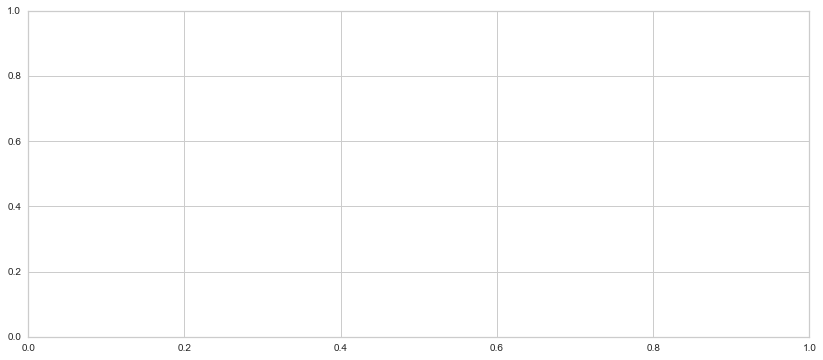

In [161]:
import seaborn as sns

fig, ax = plt.subplots(figsize=(14, 6))
single_countplot(df_unique_client, x='geolocation_state', ax=ax)
plt.show()

https://www.definitions-marketing.com/definition/segmentation-rfm/

In [162]:
import plotly.express as px
import pandas as pd

fig = px.scatter_geo(data_cluster_smart_X,lat='customer_lat',lon='customer_lng')
fig.update_layout(title = 'Origine des clients', title_x=0.5)
fig.show()